# NYU-CUSP Principles of Urban Informatics 2017 final

##### Author: Hongkai He (hh18827)

**Motivation:**

The study of NYC crime is of broad interest in the Urban Science scene, and NYPD has provided statistics on the crime (by precinct) for several years. This is an important resource to understand and analyze urban crime. There are obvious connections between crime and wealth, which relate both to access to precious goods (opportunity), and to how easy it is to commit a crime (the neighborhood safety, or perceived safety). [It has been suggested](https://journalistsresource.org/studies/government/criminal-justice/unemployment-property-crime-burglary) that unemployment correlates strongly with burglary for example, due to both opportunity and motivation. In addition there are [several pieces of research](https://www.citylab.com/solutions/2016/04/vacant-lots-green-space-crime-research-statistics/476040/) that indicate that access to green spaces affects crime.

In this final you should explore and model NYC crime:

- The first part of the exam is an exploratory analysis of the crime time series for the seven major felonies 2000-2016 (temporal domain).

- The second part of the exam attempts to relate socioeconomic features to individual crime rates by area (spatial domain).

- Lastly, if you wish, in the extra credit, you can aggregate the socioeconomic features that I indicated at the precinct level: percentage of unemployment and median income, that natively come at the census tract level from the census bureau API, and green area, for which you can use the NYC parks shapefile.


There are [hints](https://docs.google.com/document/d/1lXM07wQsbxXKfCbWYP6RJlDqFOl0E1LWWzLVJ0bEmAM/edit?usp=sharing), and partially processed datasets. Look for them. As in the midterm you can access the partially processed datasets (only one in this case) and go back to the processing task at a later time. If you then provide your own processing of the data you will be given points accordingly.


In [95]:
import numpy as np
import matplotlib.pyplot as plt
import pylab as pl
import pandas as pd
import urllib
import zipfile
import os
import geopandas as gpd

# 1. Time domain exploratory analysis

## 1.1 obtain historical data for 2000-2016 for all NYC police precincts
you can obtain the data from NYC.gov it should be an excel file called seven-major-felony-offenses-by-precinct-2000-2016.xls

In [96]:
!wget http://www.nyc.gov/html/nypd/downloads/excel/analysis_and_planning/seven-major-felony-offenses-by-precinct-2000-2016.xls

--2017-12-20 01:04:41--  http://www.nyc.gov/html/nypd/downloads/excel/analysis_and_planning/seven-major-felony-offenses-by-precinct-2000-2016.xls
Resolving www.nyc.gov... 104.106.240.221, 2600:141b:13:297::1500, 2600:141b:13:28f::1500
Connecting to www.nyc.gov|104.106.240.221|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 125952 (123K) [application/vnd.ms-excel]
Saving to: “seven-major-felony-offenses-by-precinct-2000-2016.xls.1”

100%[======================================>] 125,952     --.-K/s   in 0.04s   

2017-12-20 01:04:41 (3.31 MB/s) - “seven-major-felony-offenses-by-precinct-2000-2016.xls.1” saved [125952/125952]



# FBB left the data locally instad of moving to PUIdatta

In [97]:
data_xls = pd.read_excel('seven-major-felony-offenses-by-precinct-2000-2016.xls', 'Sheet1', index_col=None)
data_xls.to_csv('crime.csv', encoding='utf-8')

# FBB why converting exvel to csv to reread  w pandas??

In [98]:
crime = pd.read_csv("crime.csv", header= 2)
crime.head(3)

,1,PCT,CRIME,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
0,2,1,MURDER & NON NEGL. MANSLAUGHTER ...,3.0,1.0,2.0,2.0,2.0,0.0,1.0,0.0,1.0,2.0,2.0,0.0,1.0,0.0,0.0,1.0,0.0
1,3,NaN,RAPE,12.0,5.0,10.0,11.0,11.0,5.0,4.0,7.0,12.0,4.0,6.0,13.0,10.0,12.0,8.0,7.0,9.0
2,4,NaN,ROBBERY,252.0,188.0,210.0,164.0,154.0,172.0,119.0,128.0,108.0,106.0,96.0,102.0,81.0,68.0,50.0,79.0,60.0


In [99]:
crime = crime.fillna(method='ffill')
crime.head(3)

,1,PCT,CRIME,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
0,2,1,MURDER & NON NEGL. MANSLAUGHTER ...,3.0,1.0,2.0,2.0,2.0,0.0,1.0,0.0,1.0,2.0,2.0,0.0,1.0,0.0,0.0,1.0,0.0
1,3,1,RAPE,12.0,5.0,10.0,11.0,11.0,5.0,4.0,7.0,12.0,4.0,6.0,13.0,10.0,12.0,8.0,7.0,9.0
2,4,1,ROBBERY,252.0,188.0,210.0,164.0,154.0,172.0,119.0,128.0,108.0,106.0,96.0,102.0,81.0,68.0,50.0,79.0,60.0


In [100]:
crime.tail(3)

,1,PCT,CRIME,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
633,635,"5. On Sept. 28, 2012, there was a re-alignment...",TOTAL SEVEN MAJOR FELONY OFFENSES,636.0,514.0,495.0,467.0,464.0,570.0,475.0,496.0,515.0,414.0,371.0,413.0,396.0,378.0,413.0,379.0,509.0
634,636,6. The 121 pct was created on 7-1-2013 from pa...,TOTAL SEVEN MAJOR FELONY OFFENSES,636.0,514.0,495.0,467.0,464.0,570.0,475.0,496.0,515.0,414.0,371.0,413.0,396.0,378.0,413.0,379.0,509.0
635,637,7. As of 1-1-2014 complaints occurring within ...,TOTAL SEVEN MAJOR FELONY OFFENSES,636.0,514.0,495.0,467.0,464.0,570.0,475.0,496.0,515.0,414.0,371.0,413.0,396.0,378.0,413.0,379.0,509.0


In [101]:
crime.drop('1', axis=1, inplace=True)
crime.head(3)

,PCT,CRIME,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
0,1,MURDER & NON NEGL. MANSLAUGHTER ...,3.0,1.0,2.0,2.0,2.0,0.0,1.0,0.0,1.0,2.0,2.0,0.0,1.0,0.0,0.0,1.0,0.0
1,1,RAPE,12.0,5.0,10.0,11.0,11.0,5.0,4.0,7.0,12.0,4.0,6.0,13.0,10.0,12.0,8.0,7.0,9.0
2,1,ROBBERY,252.0,188.0,210.0,164.0,154.0,172.0,119.0,128.0,108.0,106.0,96.0,102.0,81.0,68.0,50.0,79.0,60.0


In [102]:
crime.describe()

,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
count,636.000000,636.000000,636.000000,636.000000,636.000000,636.000000,636.000000,636.000000,636.000000,636.000000,636.000000,636.000000,636.000000,636.000000,636.000000,636.000000,636.000000
mean,630.188679,554.213836,527.141509,499.028302,483.877358,466.738994,441.257862,417.588050,408.408805,367.578616,361.676101,368.927673,386.603774,361.996855,343.396226,338.764151,329.465409
std,886.138426,790.743142,739.370608,697.085017,675.478938,638.157402,602.084727,571.483049,556.479626,505.148518,495.912139,504.452529,533.872234,509.611397,489.177964,482.938947,473.514493
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,75.500000,70.500000,74.500000,61.750000,56.750000,54.000000,43.500000,43.750000,42.250000,36.000000,35.000000,34.000000,33.000000,29.750000,28.750000,29.750000,28.000000
50%,361.000000,315.500000,305.500000,277.500000,279.000000,275.500000,254.000000,228.000000,222.500000,208.000000,196.500000,200.500000,205.000000,177.000000,169.500000,163.500000,141.500000
75%,648.250000,581.000000,561.500000,524.750000,496.250000,514.250000,475.000000,475.000000,460.000000,414.000000,396.250000,413.000000,435.000000,415.000000,413.000000,379.000000,425.250000
max,6857.000000,6088.000000,5265.000000,5105.000000,4730.000000,4423.000000,4173.000000,3971.000000,3708.000000,3330.000000,3103.000000,3393.000000,3780.000000,3902.000000,3751.000000,3506.000000,3287.000000


## 1.2 remove outliers (likely wrongly input data)


In the data I downloaded (last download yesterday) there was a wrong set of rows for one precinct. You should be able to see it when you plot the time series. The values are obviously wrong (extremely large for all crimes). 



In [103]:
crime.columns = crime.columns.astype(str)
crime.head(3)

,PCT,CRIME,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
0,1,MURDER & NON NEGL. MANSLAUGHTER ...,3.0,1.0,2.0,2.0,2.0,0.0,1.0,0.0,1.0,2.0,2.0,0.0,1.0,0.0,0.0,1.0,0.0
1,1,RAPE,12.0,5.0,10.0,11.0,11.0,5.0,4.0,7.0,12.0,4.0,6.0,13.0,10.0,12.0,8.0,7.0,9.0
2,1,ROBBERY,252.0,188.0,210.0,164.0,154.0,172.0,119.0,128.0,108.0,106.0,96.0,102.0,81.0,68.0,50.0,79.0,60.0


In [104]:
crime.tail(3)

,PCT,CRIME,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
633,"5. On Sept. 28, 2012, there was a re-alignment...",TOTAL SEVEN MAJOR FELONY OFFENSES,636.0,514.0,495.0,467.0,464.0,570.0,475.0,496.0,515.0,414.0,371.0,413.0,396.0,378.0,413.0,379.0,509.0
634,6. The 121 pct was created on 7-1-2013 from pa...,TOTAL SEVEN MAJOR FELONY OFFENSES,636.0,514.0,495.0,467.0,464.0,570.0,475.0,496.0,515.0,414.0,371.0,413.0,396.0,378.0,413.0,379.0,509.0
635,7. As of 1-1-2014 complaints occurring within ...,TOTAL SEVEN MAJOR FELONY OFFENSES,636.0,514.0,495.0,467.0,464.0,570.0,475.0,496.0,515.0,414.0,371.0,413.0,396.0,378.0,413.0,379.0,509.0


# FBB the line below would be better as crime = crime.iloc[:616]

In [105]:
# remove rows that are not for a precinct 
crime.drop(crime.tail(20).index, inplace=True)
crime.tail(3)

,PCT,CRIME,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
613,123,GRAND LARCENY,101.0,90.0,116.0,137.0,166.0,233.0,175.0,181.0,191.0,171.0,147.0,175.0,183.0,171.0,194.0,163.0,145.0
614,123,GRAND LARCENY OF MOTOR VEHICLE ...,266.0,193.0,143.0,131.0,95.0,96.0,114.0,87.0,81.0,51.0,39.0,48.0,31.0,40.0,30.0,20.0,23.0
615,123,TOTAL SEVEN MAJOR FELONY OFFENSES,636.0,514.0,495.0,467.0,464.0,570.0,475.0,496.0,515.0,414.0,371.0,413.0,396.0,378.0,378.0,348.0,302.0


In [106]:
#the tail of your DF should look like this: 
#remove rows that are not for a precinct (all precincts are identified by numbers)
crime.tail(3)

,PCT,CRIME,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
613,123,GRAND LARCENY,101.0,90.0,116.0,137.0,166.0,233.0,175.0,181.0,191.0,171.0,147.0,175.0,183.0,171.0,194.0,163.0,145.0
614,123,GRAND LARCENY OF MOTOR VEHICLE ...,266.0,193.0,143.0,131.0,95.0,96.0,114.0,87.0,81.0,51.0,39.0,48.0,31.0,40.0,30.0,20.0,23.0
615,123,TOTAL SEVEN MAJOR FELONY OFFENSES,636.0,514.0,495.0,467.0,464.0,570.0,475.0,496.0,515.0,414.0,371.0,413.0,396.0,378.0,378.0,348.0,302.0


# FBB ok, but you may still have outliers (actually caused by ffill)

## 1.3  Plot the time series for each of the seven major felonies and for the total (aggregation of all felonies). 
There is a lot of data to plot. See the hints on how to get the time series to plot for the dataframe if you want to, or extract the data and plot with pylab. But be thoughtful about how you organize the display of information.
This will help you spot the wrong rows if you do it before the outlier rejection (that is how I realized there was an outlier). Make sure your plot shows the clean dataset though. 

In [107]:
crime_t = crime.T
crime_t.head(2)

,0,1,2,3,4,5,6,7,8,9,...,606,607,608,609,610,611,612,613,614,615
PCT,1,1,1,1,1,1,1,1,5,5,...,122,122,123,123,123,123,123,123,123,123
CRIME,MURDER & NON NEGL. MANSLAUGHTER ...,RAPE,ROBBERY,FELONY ASSAULT,BURGLARY,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE ...,TOTAL SEVEN MAJOR FELONY OFFENSES,MURDER & NON NEGL. MANSLAUGHTER ...,RAPE,...,GRAND LARCENY OF MOTOR VEHICLE ...,TOTAL SEVEN MAJOR FELONY OFFENSES,MURDER & NON NEGL. MANSLAUGHTER ...,RAPE,ROBBERY,FELONY ASSAULT,BURGLARY,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE ...,TOTAL SEVEN MAJOR FELONY OFFENSES


In [108]:
# resetting headers
crime_t.columns = crime_t.iloc[1]
crime_t.head(2)

CRIME,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,FELONY ASSAULT,BURGLARY,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,TOTAL SEVEN MAJOR FELONY OFFENSES,MURDER & NON NEGL. MANSLAUGHTER,RAPE,...,GRAND LARCENY OF MOTOR VEHICLE,TOTAL SEVEN MAJOR FELONY OFFENSES,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,FELONY ASSAULT,BURGLARY,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,TOTAL SEVEN MAJOR FELONY OFFENSES
PCT,1,1,1,1,1,1,1,1,5,5,...,122,122,123,123,123,123,123,123,123,123
CRIME,MURDER & NON NEGL. MANSLAUGHTER ...,RAPE,ROBBERY,FELONY ASSAULT,BURGLARY,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE ...,TOTAL SEVEN MAJOR FELONY OFFENSES,MURDER & NON NEGL. MANSLAUGHTER ...,RAPE,...,GRAND LARCENY OF MOTOR VEHICLE ...,TOTAL SEVEN MAJOR FELONY OFFENSES,MURDER & NON NEGL. MANSLAUGHTER ...,RAPE,ROBBERY,FELONY ASSAULT,BURGLARY,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE ...,TOTAL SEVEN MAJOR FELONY OFFENSES


In [109]:
# dropping redundant rows
crime_t=crime_t.drop(crime_t.index[1])
crime_t.head(3)

CRIME,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,FELONY ASSAULT,BURGLARY,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,TOTAL SEVEN MAJOR FELONY OFFENSES,MURDER & NON NEGL. MANSLAUGHTER,RAPE,...,GRAND LARCENY OF MOTOR VEHICLE,TOTAL SEVEN MAJOR FELONY OFFENSES,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,FELONY ASSAULT,BURGLARY,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,TOTAL SEVEN MAJOR FELONY OFFENSES
PCT,1,1,1,1,1,1,1,1,5,5,...,122,122,123,123,123,123,123,123,123,123
2000.0,3,12,252,139,475,2358,199,3438,4,9,...,667,1692,2,3,35,67,162,101,266,636
2001.0,1,5,188,164,437,2117,157,3069,3,3,...,532,1434,2,2,30,57,140,90,193,514


In [110]:
# remove unnecessary spaces in headers
crime_t.columns = crime_t.columns.str.strip()
crime_t.columns.tolist()

['MURDER & NON NEGL. MANSLAUGHTER',
 'RAPE',
 'ROBBERY',
 'FELONY ASSAULT',
 'BURGLARY',
 'GRAND LARCENY',
 'GRAND LARCENY OF MOTOR VEHICLE',
 'TOTAL SEVEN MAJOR FELONY OFFENSES',
 'MURDER & NON NEGL. MANSLAUGHTER',
 'RAPE',
 'ROBBERY',
 'FELONY ASSAULT',
 'BURGLARY',
 'GRAND LARCENY',
 'GRAND LARCENY OF MOTOR VEHICLE',
 'TOTAL SEVEN MAJOR FELONY OFFENSES',
 'MURDER & NON NEGL. MANSLAUGHTER',
 'RAPE',
 'ROBBERY',
 'FELONY ASSAULT',
 'BURGLARY',
 'GRAND LARCENY',
 'GRAND LARCENY OF MOTOR VEHICLE',
 'TOTAL SEVEN MAJOR FELONY OFFENSES',
 'MURDER & NON NEGL. MANSLAUGHTER',
 'RAPE',
 'ROBBERY',
 'FELONY ASSAULT',
 'BURGLARY',
 'GRAND LARCENY',
 'GRAND LARCENY OF MOTOR VEHICLE',
 'TOTAL SEVEN MAJOR FELONY OFFENSES',
 'MURDER & NON NEGL. MANSLAUGHTER',
 'RAPE',
 'ROBBERY',
 'FELONY ASSAULT',
 'BURGLARY',
 'GRAND LARCENY',
 'GRAND LARCENY OF MOTOR VEHICLE',
 'TOTAL SEVEN MAJOR FELONY OFFENSES',
 'MURDER & NON NEGL. MANSLAUGHTER',
 'RAPE',
 'ROBBERY',
 'FELONY ASSAULT',
 'BURGLARY',
 'GRAND LAR

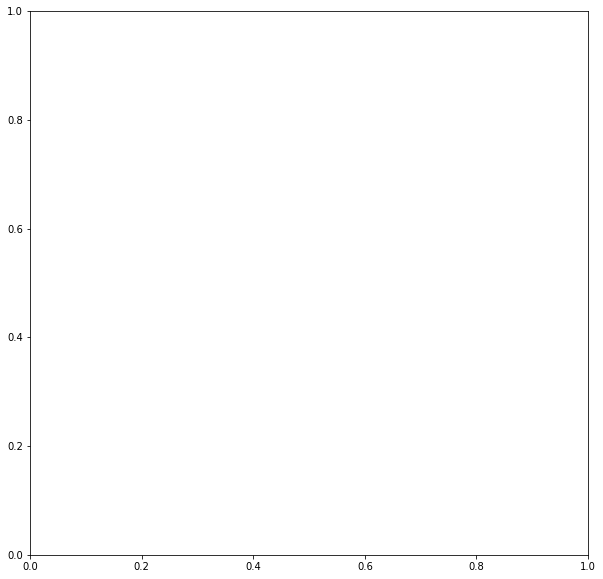

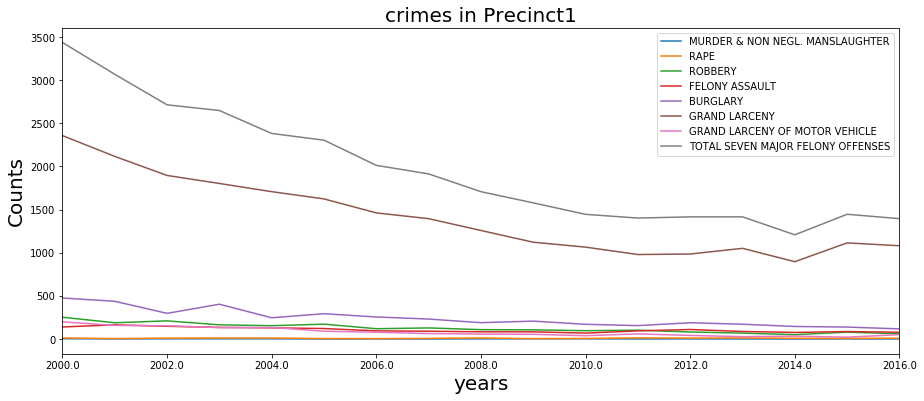

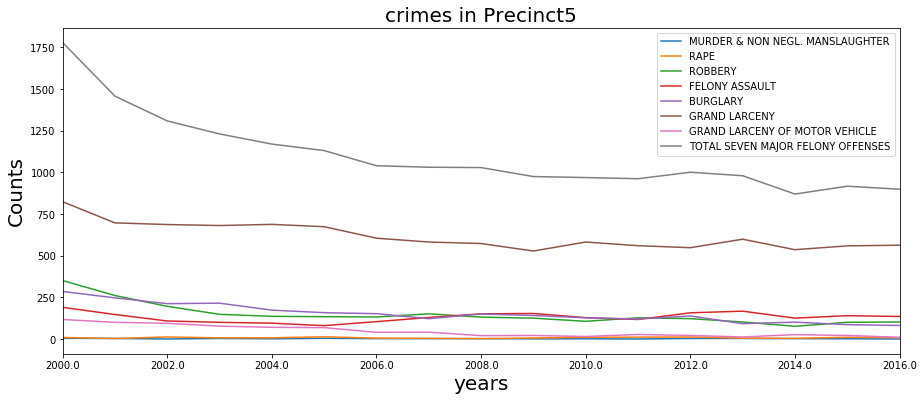

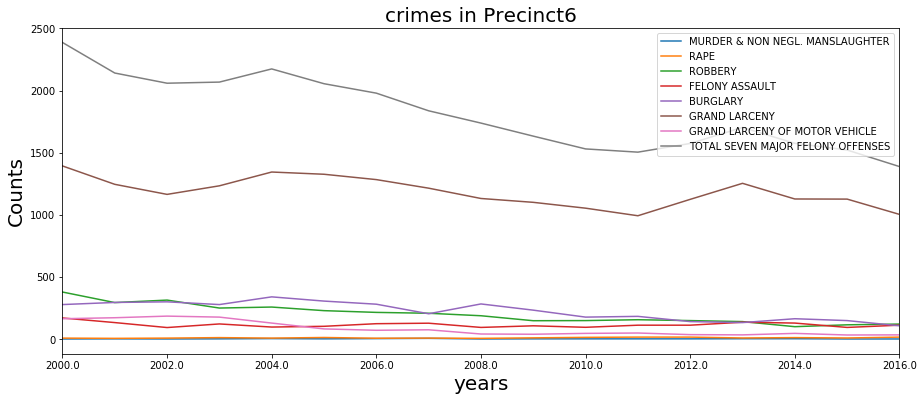

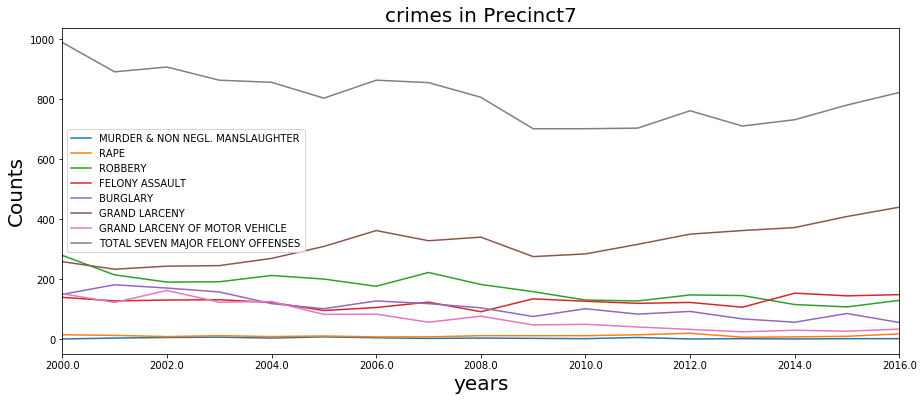

...

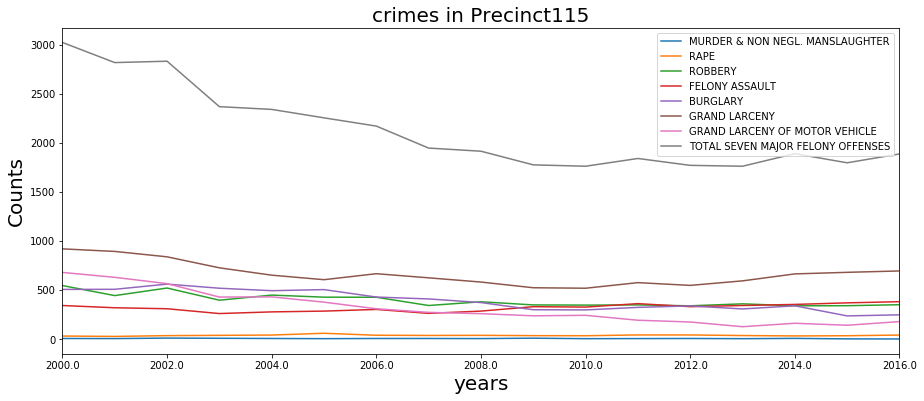

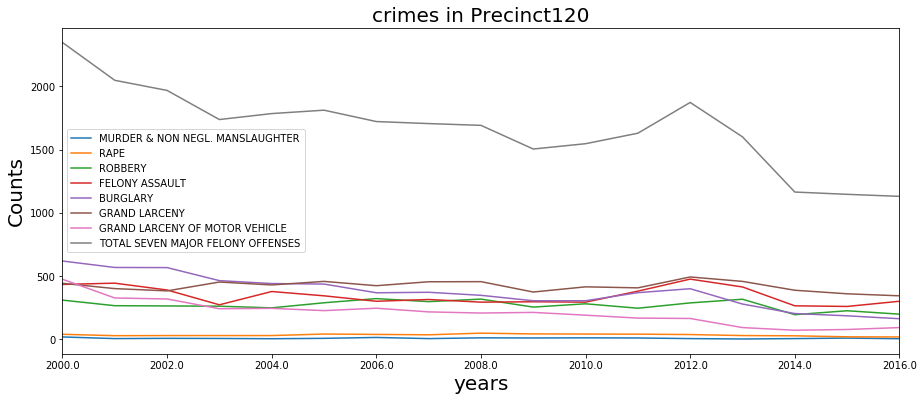

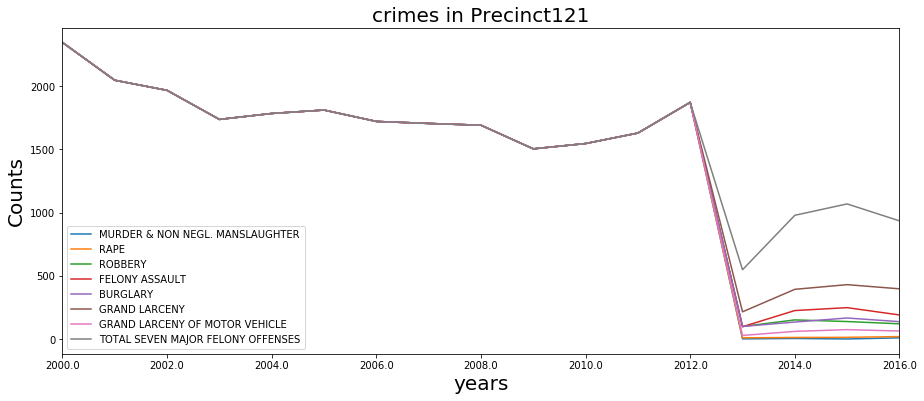

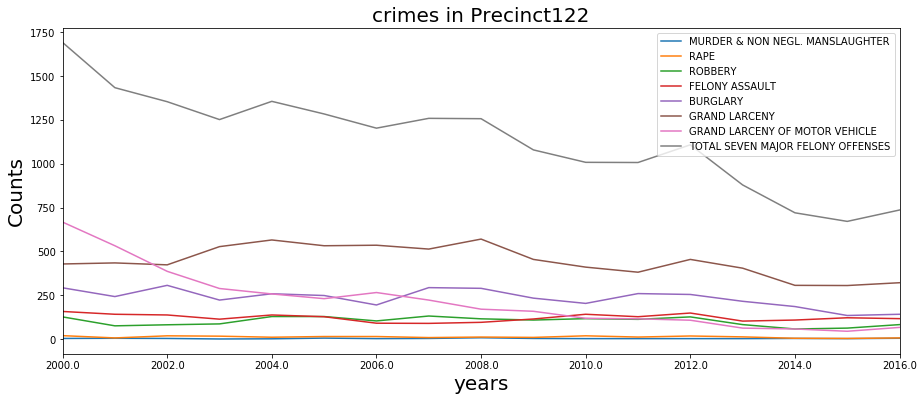

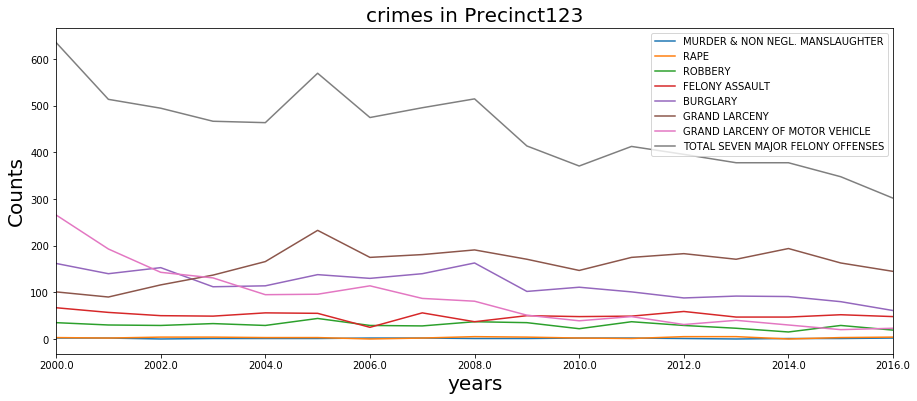

In [111]:
# plot seven felonies for each precinct
for i in range(0, 616, 8):
    ax = crime_t.iloc[:,i:i+8][1:].astype(float).plot(figsize=(15, 6))
    ax.set_title("crimes in Precinct"+crime_t.iloc[0,i], fontsize=20)
    pl.xlabel("years", fontsize=20)
    pl.ylabel("Counts", fontsize=20)
    pl.legend(fontsize=10, loc="best")

    plt.show()

###### fig 1: time series plots of 7 felonies and the total agregation of felonies in every precinct, from 2000 to 2016. There are 76 precincts, hence there are 76 corresponding plots above.

#### Frome the plots we can easily detect that compared with other precincts, precinct 121 has abnormal behaviour before 2013. By looking at the raw dataset we know that it is due to absence of data. Hence we want to remove these outliers.

In [112]:
# remove outliers in precinct 121
crime[crime.PCT == "121"]

,PCT,CRIME,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
592,121,MURDER & NON NEGL. MANSLAUGHTER ...,2347.0,2048.0,1968.0,1738.0,1785.0,1812.0,1722.0,1706.0,1692.0,1505.0,1547.0,1630.0,1873.0,1.0,4.0,0.0,9.0
593,121,RAPE,2347.0,2048.0,1968.0,1738.0,1785.0,1812.0,1722.0,1706.0,1692.0,1505.0,1547.0,1630.0,1873.0,9.0,12.0,13.0,19.0
594,121,ROBBERY,2347.0,2048.0,1968.0,1738.0,1785.0,1812.0,1722.0,1706.0,1692.0,1505.0,1547.0,1630.0,1873.0,99.0,151.0,138.0,120.0
595,121,FELONY ASSAULT,2347.0,2048.0,1968.0,1738.0,1785.0,1812.0,1722.0,1706.0,1692.0,1505.0,1547.0,1630.0,1873.0,97.0,225.0,248.0,190.0
596,121,BURGLARY,2347.0,2048.0,1968.0,1738.0,1785.0,1812.0,1722.0,1706.0,1692.0,1505.0,1547.0,1630.0,1873.0,99.0,134.0,166.0,137.0
597,121,GRAND LARCENY,2347.0,2048.0,1968.0,1738.0,1785.0,1812.0,1722.0,1706.0,1692.0,1505.0,1547.0,1630.0,1873.0,215.0,393.0,430.0,397.0
598,121,GRAND LARCENY OF MOTOR VEHICLE ...,2347.0,2048.0,1968.0,1738.0,1785.0,1812.0,1722.0,1706.0,1692.0,1505.0,1547.0,1630.0,1873.0,28.0,60.0,74.0,63.0
599,121,TOTAL SEVEN MAJOR FELONY OFFENSES,2347.0,2048.0,1968.0,1738.0,1785.0,1812.0,1722.0,1706.0,1692.0,1505.0,1547.0,1630.0,1873.0,548.0,979.0,1069.0,935.0


In [113]:
crime = crime.drop(crime[crime.PCT == "121"].index)
crime.tail(20)

,PCT,CRIME,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
588,120,BURGLARY,620.0,569.0,568.0,465.0,442.0,438.0,369.0,373.0,349.0,306.0,306.0,370.0,401.0,280.0,205.0,187.0,164.0
589,120,GRAND LARCENY,444.0,402.0,384.0,454.0,431.0,459.0,425.0,456.0,457.0,375.0,416.0,408.0,494.0,459.0,389.0,361.0,345.0
590,120,GRAND LARCENY OF MOTOR VEHICLE ...,476.0,328.0,320.0,243.0,246.0,228.0,247.0,218.0,209.0,214.0,192.0,169.0,166.0,94.0,73.0,79.0,94.0
591,120,TOTAL SEVEN MAJOR FELONY OFFENSES,2347.0,2048.0,1968.0,1738.0,1785.0,1812.0,1722.0,1706.0,1692.0,1505.0,1547.0,1630.0,1873.0,1601.0,1165.0,1147.0,1131.0
600,122,MURDER & NON NEGL. MANSLAUGHTER ...,3.0,4.0,3.0,0.0,1.0,5.0,2.0,3.0,7.0,3.0,2.0,2.0,2.0,2.0,3.0,2.0,4.0
601,122,RAPE,19.0,6.0,18.0,16.0,10.0,14.0,14.0,8.0,11.0,9.0,18.0,11.0,17.0,12.0,4.0,3.0,6.0
602,122,ROBBERY,126.0,75.0,81.0,86.0,128.0,128.0,103.0,131.0,115.0,108.0,116.0,112.0,126.0,82.0,57.0,62.0,82.0
603,122,FELONY ASSAULT,157.0,141.0,137.0,113.0,137.0,127.0,90.0,89.0,95.0,114.0,141.0,127.0,148.0,102.0,108.0,121.0,116.0
604,122,BURGLARY,292.0,242.0,306.0,222.0,258.0,248.0,194.0,293.0,289.0,233.0,203.0,259.0,254.0,215.0,185.0,134.0,141.0
605,122,GRAND LARCENY,428.0,434.0,423.0,527.0,565.0,532.0,535.0,513.0,570.0,454.0,410.0,381.0,454.0,404.0,306.0,305.0,321.0


In [114]:
# create a new transposed dataframe without precinct 121
crime_T = crime.T
crime_T.columns = crime_T.iloc[1]
crime_T=crime_T.drop(crime_T.index[1])
crime_T.head(3)

CRIME,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,FELONY ASSAULT,BURGLARY,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,TOTAL SEVEN MAJOR FELONY OFFENSES,MURDER & NON NEGL. MANSLAUGHTER,RAPE,...,GRAND LARCENY OF MOTOR VEHICLE,TOTAL SEVEN MAJOR FELONY OFFENSES,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,FELONY ASSAULT,BURGLARY,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,TOTAL SEVEN MAJOR FELONY OFFENSES
PCT,1,1,1,1,1,1,1,1,5,5,...,122,122,123,123,123,123,123,123,123,123
2000.0,3,12,252,139,475,2358,199,3438,4,9,...,667,1692,2,3,35,67,162,101,266,636
2001.0,1,5,188,164,437,2117,157,3069,3,3,...,532,1434,2,2,30,57,140,90,193,514


In [115]:
crime_T.columns = crime_T.columns.str.strip()
crime_T.columns.tolist()

['MURDER & NON NEGL. MANSLAUGHTER',
 'RAPE',
 'ROBBERY',
 'FELONY ASSAULT',
 'BURGLARY',
 'GRAND LARCENY',
 'GRAND LARCENY OF MOTOR VEHICLE',
 'TOTAL SEVEN MAJOR FELONY OFFENSES',
 'MURDER & NON NEGL. MANSLAUGHTER',
 'RAPE',
 'ROBBERY',
 'FELONY ASSAULT',
 'BURGLARY',
 'GRAND LARCENY',
 'GRAND LARCENY OF MOTOR VEHICLE',
 'TOTAL SEVEN MAJOR FELONY OFFENSES',
 'MURDER & NON NEGL. MANSLAUGHTER',
 'RAPE',
 'ROBBERY',
 'FELONY ASSAULT',
 'BURGLARY',
 'GRAND LARCENY',
 'GRAND LARCENY OF MOTOR VEHICLE',
 'TOTAL SEVEN MAJOR FELONY OFFENSES',
 'MURDER & NON NEGL. MANSLAUGHTER',
 'RAPE',
 'ROBBERY',
 'FELONY ASSAULT',
 'BURGLARY',
 'GRAND LARCENY',
 'GRAND LARCENY OF MOTOR VEHICLE',
 'TOTAL SEVEN MAJOR FELONY OFFENSES',
 'MURDER & NON NEGL. MANSLAUGHTER',
 'RAPE',
 'ROBBERY',
 'FELONY ASSAULT',
 'BURGLARY',
 'GRAND LARCENY',
 'GRAND LARCENY OF MOTOR VEHICLE',
 'TOTAL SEVEN MAJOR FELONY OFFENSES',
 'MURDER & NON NEGL. MANSLAUGHTER',
 'RAPE',
 'ROBBERY',
 'FELONY ASSAULT',
 'BURGLARY',
 'GRAND LAR

In [116]:
crime_T.head()

CRIME,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,FELONY ASSAULT,BURGLARY,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,TOTAL SEVEN MAJOR FELONY OFFENSES,MURDER & NON NEGL. MANSLAUGHTER,RAPE,...,GRAND LARCENY OF MOTOR VEHICLE,TOTAL SEVEN MAJOR FELONY OFFENSES,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,FELONY ASSAULT,BURGLARY,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,TOTAL SEVEN MAJOR FELONY OFFENSES
PCT,1,1,1,1,1,1,1,1,5,5,...,122,122,123,123,123,123,123,123,123,123
2000.0,3,12,252,139,475,2358,199,3438,4,9,...,667,1692,2,3,35,67,162,101,266,636
2001.0,1,5,188,164,437,2117,157,3069,3,3,...,532,1434,2,2,30,57,140,90,193,514
2002.0,2,10,210,147,297,1896,153,2715,0,12,...,386,1354,0,4,29,50,153,116,143,495
2003.0,2,11,164,134,403,1803,132,2649,3,7,...,288,1252,1,4,33,49,112,137,131,467


In [117]:
# incorperating precinct numbers to the column names
col = []
for i in range(len(crime_T.columns)):
    col.append(crime_T.columns[i]+" P"+crime_T.iloc[0][i])
crime_T.columns = col
crime_T.head()

,MURDER & NON NEGL. MANSLAUGHTER P1,RAPE P1,ROBBERY P1,FELONY ASSAULT P1,BURGLARY P1,GRAND LARCENY P1,GRAND LARCENY OF MOTOR VEHICLE P1,TOTAL SEVEN MAJOR FELONY OFFENSES P1,MURDER & NON NEGL. MANSLAUGHTER P5,RAPE P5,...,GRAND LARCENY OF MOTOR VEHICLE P122,TOTAL SEVEN MAJOR FELONY OFFENSES P122,MURDER & NON NEGL. MANSLAUGHTER P123,RAPE P123,ROBBERY P123,FELONY ASSAULT P123,BURGLARY P123,GRAND LARCENY P123,GRAND LARCENY OF MOTOR VEHICLE P123,TOTAL SEVEN MAJOR FELONY OFFENSES P123
PCT,1,1,1,1,1,1,1,1,5,5,...,122,122,123,123,123,123,123,123,123,123
2000.0,3,12,252,139,475,2358,199,3438,4,9,...,667,1692,2,3,35,67,162,101,266,636
2001.0,1,5,188,164,437,2117,157,3069,3,3,...,532,1434,2,2,30,57,140,90,193,514
2002.0,2,10,210,147,297,1896,153,2715,0,12,...,386,1354,0,4,29,50,153,116,143,495
2003.0,2,11,164,134,403,1803,132,2649,3,7,...,288,1252,1,4,33,49,112,137,131,467


##### now plot one chart for each felony and for the total 

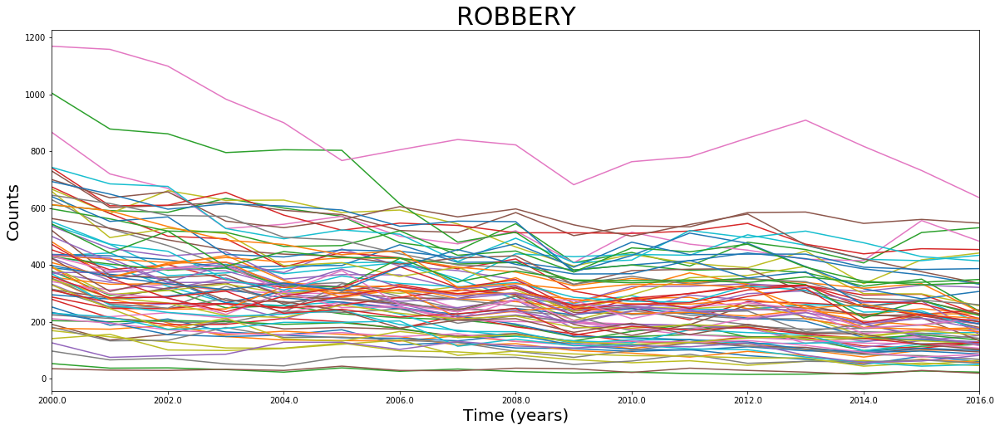

In [118]:
# plotting for robbery
rob = pd.DataFrame()
for i in crime_T.columns:
    if "ROBBERY" in i:
        rob[i] = crime_T[i]
        
rob[1:].plot(figsize=(20,8), legend = None)
plt.xlabel("Time (years)", fontsize=20)
plt.ylabel("Counts", fontsize = 20)
plt.title("ROBBERY", fontsize = 30)
plt.show()

###### fig2: time series plot for robbery committed in all precincts, from 2000 to 2016. Most of the precincts have witnessed stable trends for robbery. The amount of crime committed varies across different precincts.

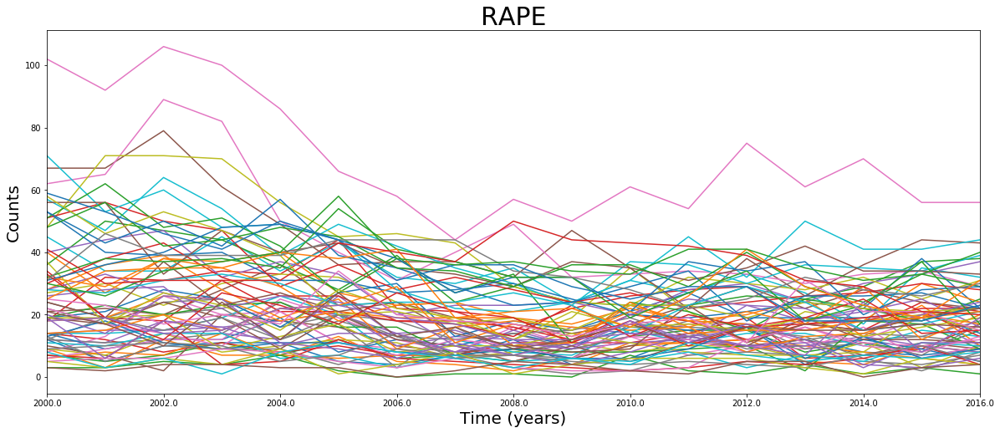

In [119]:
# plotting for rape
rape = pd.DataFrame()
for i in crime_T.columns:
    if "RAPE" in i:
        rape[i] = crime_T[i]
        
rape[1:].plot(figsize=(20,8), legend = None)
plt.xlabel("Time (years)", fontsize=20)
plt.ylabel("Counts", fontsize = 20)
plt.title("RAPE", fontsize = 30)
plt.show()

###### fig3: time series plot for rape committed in all precincts, from 2000 to 2016. Most of the precincts have witnessed stable trends for rape. The amount of crime committed varies across different precincts.

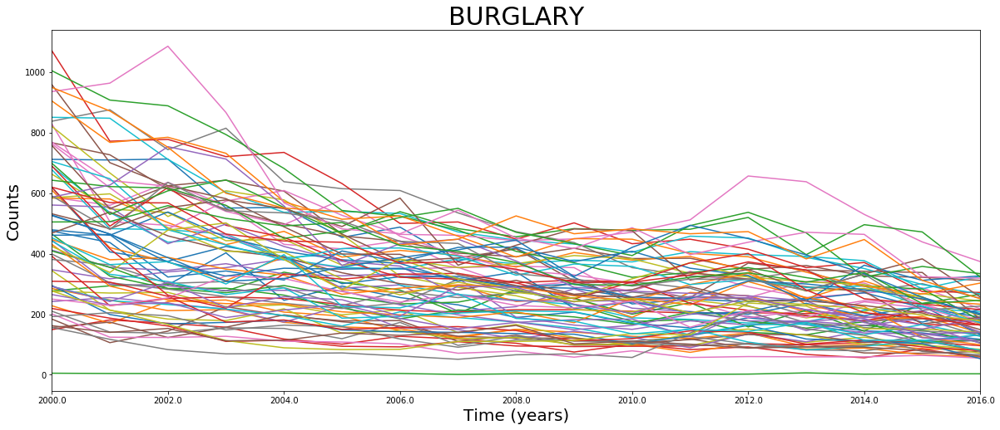

In [120]:
# plotting for burglary
burglary = pd.DataFrame()
for i in crime_T.columns:
    if "BURGLARY" in i:
        burglary[i] = crime_T[i]
        
burglary[1:].plot(figsize=(20,8), legend = None)
plt.xlabel("Time (years)", fontsize=20)
plt.ylabel("Counts", fontsize = 20)
plt.title("BURGLARY", fontsize = 30)
plt.show()

###### fig4: time series plot for burglary committed in all precincts, from 2000 to 2016. The variance among different precincts has been reduced over this 16 years and there apprears to be a slight downward trend.

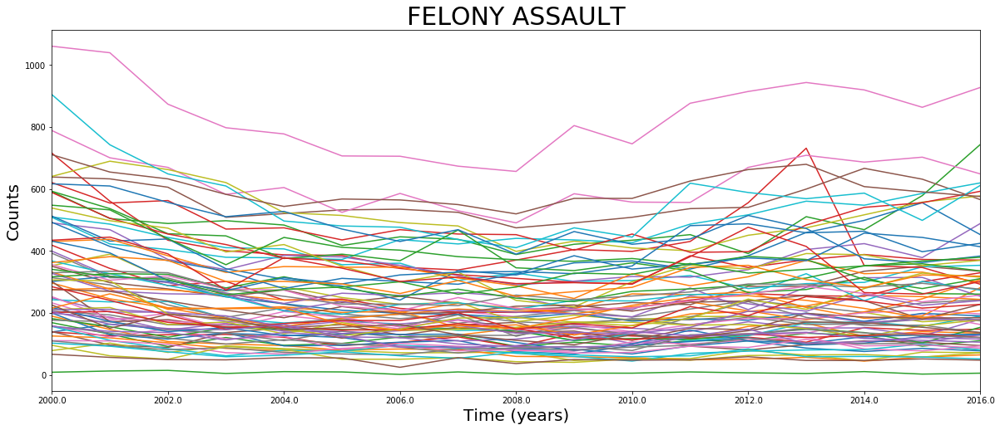

In [121]:
# plotting for felony assult
felony = pd.DataFrame()
for i in crime_T.columns:
    if "FELONY ASSAULT" in i:
        felony[i] = crime_T[i]
        
felony[1:].plot(figsize=(20,8), legend = None)
plt.xlabel("Time (years)", fontsize=20)
plt.ylabel("Counts", fontsize = 20)
plt.title("FELONY ASSAULT", fontsize = 30)
plt.show()

###### fig5: time series plot for felony assult committed in all precincts, from 2000 to 2016. Most of the precincts have witnessed stable trends for this crime. The amount of crime committed varies significantly across different precincts.

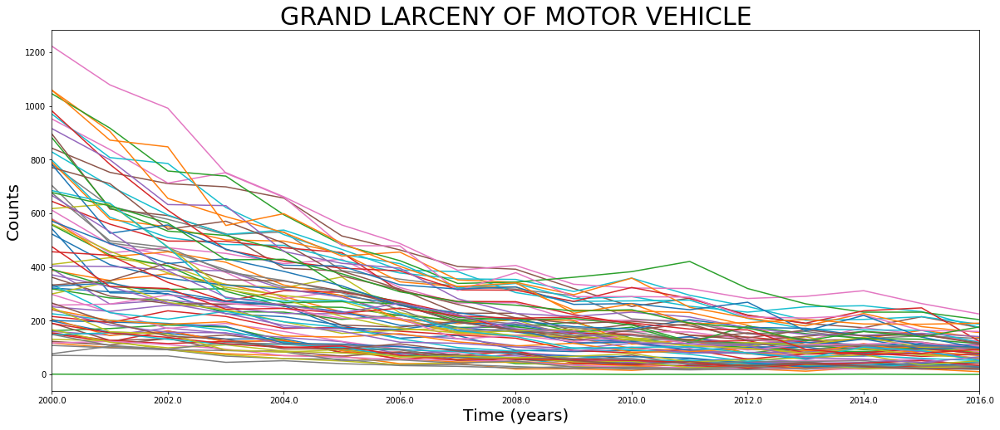

In [122]:
# plotting for grand larcency with moter vehicles
MV = pd.DataFrame()
for i in crime_T.columns:
    if "GRAND LARCENY OF MOTOR VEHICLE" in i:
        MV[i] = crime_T[i]
        
MV[1:].plot(figsize=(20,8), legend = None)
plt.xlabel("Time (years)", fontsize=20)
plt.ylabel("Counts", fontsize = 20)
plt.title("GRAND LARCENY OF MOTOR VEHICLE", fontsize = 30)
plt.show()

###### fig6: time series plot for grand larcency of motor vehicle committed in all precincts, from 2000 to 2016. The variance among different precincts has been remarkbly reduced over time and there is an obvious downward trend for most precincts.

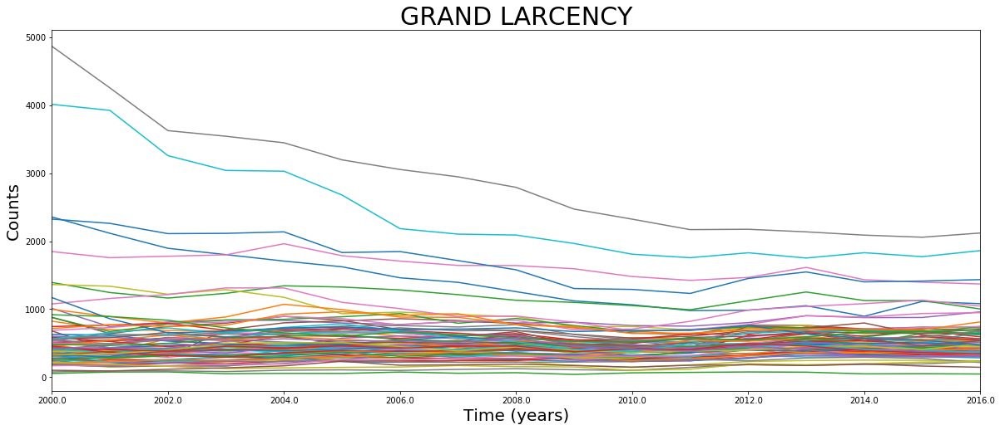

In [123]:
# plotting for grand larcency
gl = pd.DataFrame()
for i in crime_T.columns:
    if ("GRAND LARCENY" in i) & ("MOTOR VEHICLE" not in i):
        gl[i] = crime_T[i]
        
gl[1:].plot(figsize=(20,8), legend = None)
plt.xlabel("Time (years)", fontsize=20)
plt.ylabel("Counts", fontsize = 20)
plt.title("GRAND LARCENCY", fontsize = 30)
plt.show()

###### fig 7: time series plot for grand larcency committed in all precincts, from 2000 to 2016. The variance among different precincts has been reduced over time. the amount of this crime in most of precincts are below 1000, with some precincts suffer from very high amount of crime.

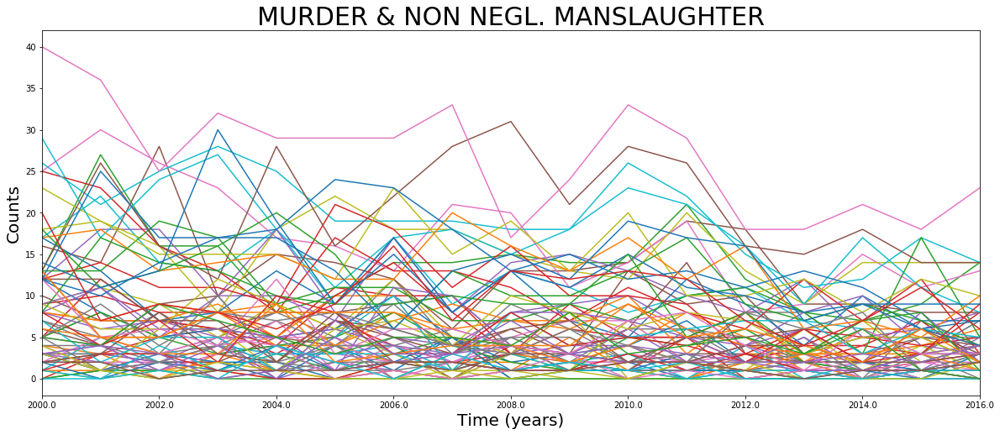

In [124]:
# plotting for murder
murder = pd.DataFrame()
for i in crime_T.columns:
    if "MURDER" in i:
        murder[i] = crime_T[i]
        
murder[1:].plot(figsize=(20,8), legend = None)
plt.xlabel("Time (years)", fontsize=20)
plt.ylabel("Counts", fontsize = 20)
plt.title("MURDER & NON NEGL. MANSLAUGHTER", fontsize = 30)
plt.show()

###### fig 8: time series plot for murder committed in all precincts, from 2000 to 2016. There seems to be enormous fluctuations and even periodicity in the amount of murder for most precincts. 

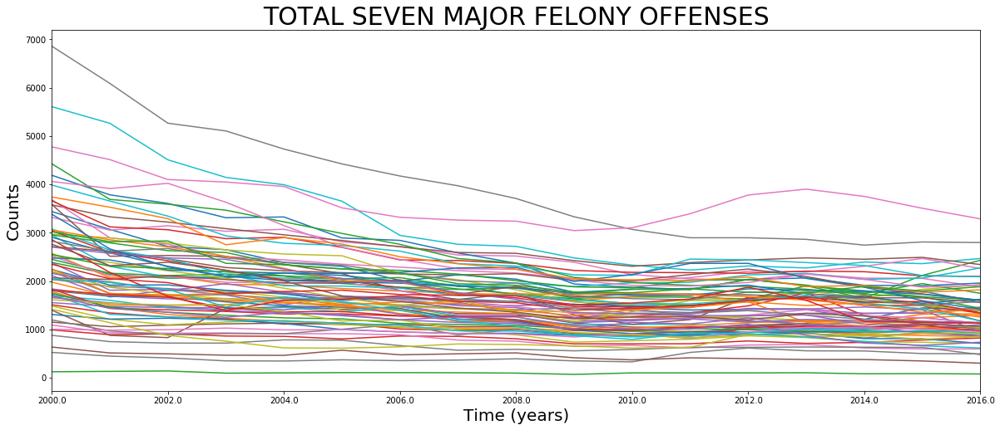

In [125]:
# plotting for total crime
tot = pd.DataFrame()
for i in crime_T.columns:
    if "TOTAL" in i:
        tot[i] = crime_T[i]
        
tot[1:].plot(figsize=(20,8), legend = None)
plt.xlabel("Time (years)", fontsize=20)
plt.ylabel("Counts", fontsize = 20)
plt.title("TOTAL SEVEN MAJOR FELONY OFFENSES", fontsize = 30)
plt.show()

###### fig9: time series plot for murder committed in all precincts, from 2000 to 2016. The variance among different precincts has been reduced significantly over time. 

# FBB ok but your choice to display the figure does nott allow to compare the time series for different crimes. also why are youars as floating points?
# task 1.2 10
# task 1.3 8 - good comments tho


## 1.4 calculate the mean and standard deviation in time for each precinct and each crime

In [141]:
for i in range(0, 608, 8):
    print("\n summary statistics for PRECINCT "+ crime_T.iloc[0,i] +" are listed below:"+"\n")
    print("MEANS for each crime:")
    print(crime_T.iloc[:,i:i+8][1:].astype(float).mean())
    print("STANDARD DEVIATION for each crime:")
    print(crime_T.iloc[:,i:i+8][1:].astype(float).std())


 summary statistics for PRECINCT 1 are listed below:

MEANS for each crime:
MURDER & NON NEGL. MANSLAUGHTER P1         1.058824
RAPE P1                                    8.588235
ROBBERY P1                               125.705882
FELONY ASSAULT P1                        104.882353
BURGLARY P1                              242.176471
GRAND LARCENY P1                        1406.705882
GRAND LARCENY OF MOTOR VEHICLE P1         81.470588
TOTAL SEVEN MAJOR FELONY OFFENSES P1    1970.588235
dtype: float64
STANDARD DEVIATION for each crime:
MURDER & NON NEGL. MANSLAUGHTER P1        0.966345
RAPE P1                                   3.063063
ROBBERY P1                               56.514118
FELONY ASSAULT P1                        28.676825
BURGLARY P1                             107.459431
GRAND LARCENY P1                        440.662536
GRAND LARCENY OF MOTOR VEHICLE P1        53.396065
TOTAL SEVEN MAJOR FELONY OFFENSES P1    674.856379
dtype: float64

 summary statistics for PRECINCT 

MURDER & NON NEGL. MANSLAUGHTER P78         1.352941
RAPE P78                                    7.764706
ROBBERY P78                               185.411765
FELONY ASSAULT P78                         83.588235
BURGLARY P78                              217.529412
GRAND LARCENY P78                         441.941176
GRAND LARCENY OF MOTOR VEHICLE P78        132.882353
TOTAL SEVEN MAJOR FELONY OFFENSES P78    1070.470588
dtype: float64
STANDARD DEVIATION for each crime:
MURDER & NON NEGL. MANSLAUGHTER P78        1.320094
RAPE P78                                   3.400908
ROBBERY P78                               66.965531
FELONY ASSAULT P78                        24.525647
BURGLARY P78                              84.214100
GRAND LARCENY P78                         61.484216
GRAND LARCENY OF MOTOR VEHICLE P78        82.390748
TOTAL SEVEN MAJOR FELONY OFFENSES P78    218.173990
dtype: float64

 summary statistics for PRECINCT 79 are listed below:

MEANS for each crime:
MURDER & NON NEGL

### EC1 - you can do a quantitative analysis of these time series (trends, periodicity etc.). But I recommend you only do it after you proceed to the other mandatory tasks. 

# FBB not what I meant but ok
# task 1.4 10/10

## 1.5 extract the total crime row for each precinct and cluster the time series. Plot the clusters and discuss the clustering and the trends that you see. 
(as done in HW10 and 11, see [tips on clustering](https://github.com/fedhere/PUI2017_fb55/blob/master/final/preprocessinANDclustering.ipynb))
I am not looking for a particularly rigorous clustering analysis here, so you do not need to obsess over the right number of clusters for example, or the exact density for DBscan. However, once the clusters are done, visualize them, and make sure that they are convincing clusters that do display homogeneous trends that are different for the different clusters.

In [142]:
# extract the total crime row for each precinct
totcrime = crime[crime.CRIME == "TOTAL SEVEN MAJOR FELONY OFFENSES"]

In [143]:
totcrime.head(3)

,PCT,CRIME,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
7,1,TOTAL SEVEN MAJOR FELONY OFFENSES,3438.0,3069.0,2715.0,2649.0,2383.0,2305.0,2013.0,1914.0,1708.0,1578.0,1445.0,1402.0,1416.0,1416.0,1208.0,1446.0,1395.0
15,5,TOTAL SEVEN MAJOR FELONY OFFENSES,1780.0,1458.0,1309.0,1231.0,1170.0,1131.0,1040.0,1031.0,1029.0,975.0,969.0,962.0,1001.0,980.0,870.0,917.0,899.0
23,6,TOTAL SEVEN MAJOR FELONY OFFENSES,2387.0,2141.0,2059.0,2068.0,2174.0,2055.0,1979.0,1837.0,1738.0,1633.0,1530.0,1504.0,1574.0,1703.0,1575.0,1521.0,1388.0


In [144]:
totcrime_t = totcrime.T

In [145]:
# reset the headers for transposed total crime dataset
totcrime_t.columns = totcrime_t.iloc[1]
totcrime_t=totcrime_t.drop(totcrime_t.index[1])
totcrime_t

CRIME,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,...,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES,TOTAL SEVEN MAJOR FELONY OFFENSES
PCT,1,5,6,7,9,10,13,14,17,18,...,109,110,111,112,113,114,115,120,122,123
2000.0,3438,1780,2387,990,2115,1398,3317,6857,2028,5607,...,4060,2822,1614,2042,3382,3738,3021,2347,1692,636
2001.0,3069,1458,2141,892,1672,877,3054,6088,1990,5263,...,3914,2619,1540,1971,2666,3528,2816,2048,1434,514
2002.0,2715,1309,2059,908,1809,831,3145,5265,1801,4508,...,4022,2673,1507,1829,2294,3291,2830,1968,1354,495
2003.0,2649,1231,2068,864,1801,1436,3031,5105,1796,4144,...,3630,2477,1515,1465,2094,2751,2367,1738,1252,467
2004.0,2383,1170,2174,857,1747,1466,3071,4730,1667,3992,...,3148,2390,1366,1675,2165,2899,2339,1785,1356,464
2005.0,2305,1131,2055,804,1664,1418,2812,4423,1397,3652,...,2702,2331,1176,1573,2158,2766,2253,1812,1284,570
2006.0,2013,1040,1979,864,1579,1469,2716,4173,1391,2945,...,2448,2160,1196,1395,2180,2502,2169,1722,1203,475
2007.0,1914,1031,1837,856,1519,1326,2540,3971,1277,2761,...,2256,2007,1005,1182,2272,2358,1945,1706,1259,496
2008.0,1708,1029,1738,807,1495,1321,2518,3708,1269,2718,...,2243,1961,1033,1066,2283,2249,1913,1692,1257,515


# FBB unnecessary to transpose!

In [146]:
# incorperating precinct numbers to the column names
col = []
for i in range(len(totcrime_t.columns)):
    col.append(totcrime_t.columns[i]+" P"+totcrime_t.iloc[0][i])

In [147]:
totcrime_t.columns = col
totcrime_t=totcrime_t.drop(totcrime_t.index[0])
totcrime_t.head()

,TOTAL SEVEN MAJOR FELONY OFFENSES P1,TOTAL SEVEN MAJOR FELONY OFFENSES P5,TOTAL SEVEN MAJOR FELONY OFFENSES P6,TOTAL SEVEN MAJOR FELONY OFFENSES P7,TOTAL SEVEN MAJOR FELONY OFFENSES P9,TOTAL SEVEN MAJOR FELONY OFFENSES P10,TOTAL SEVEN MAJOR FELONY OFFENSES P13,TOTAL SEVEN MAJOR FELONY OFFENSES P14,TOTAL SEVEN MAJOR FELONY OFFENSES P17,TOTAL SEVEN MAJOR FELONY OFFENSES P18,...,TOTAL SEVEN MAJOR FELONY OFFENSES P109,TOTAL SEVEN MAJOR FELONY OFFENSES P110,TOTAL SEVEN MAJOR FELONY OFFENSES P111,TOTAL SEVEN MAJOR FELONY OFFENSES P112,TOTAL SEVEN MAJOR FELONY OFFENSES P113,TOTAL SEVEN MAJOR FELONY OFFENSES P114,TOTAL SEVEN MAJOR FELONY OFFENSES P115,TOTAL SEVEN MAJOR FELONY OFFENSES P120,TOTAL SEVEN MAJOR FELONY OFFENSES P122,TOTAL SEVEN MAJOR FELONY OFFENSES P123
2000.0,3438,1780,2387,990,2115,1398,3317,6857,2028,5607,...,4060,2822,1614,2042,3382,3738,3021,2347,1692,636
2001.0,3069,1458,2141,892,1672,877,3054,6088,1990,5263,...,3914,2619,1540,1971,2666,3528,2816,2048,1434,514
2002.0,2715,1309,2059,908,1809,831,3145,5265,1801,4508,...,4022,2673,1507,1829,2294,3291,2830,1968,1354,495
2003.0,2649,1231,2068,864,1801,1436,3031,5105,1796,4144,...,3630,2477,1515,1465,2094,2751,2367,1738,1252,467
2004.0,2383,1170,2174,857,1747,1466,3071,4730,1667,3992,...,3148,2390,1366,1675,2165,2899,2339,1785,1356,464


In [148]:
# transpose back to the formation with time as rows, X is used for clustering
X = totcrime_t.T
X

,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
TOTAL SEVEN MAJOR FELONY OFFENSES P1,3438,3069,2715,2649,2383,2305,2013,1914,1708,1578,1445,1402,1416,1416,1208,1446,1395
TOTAL SEVEN MAJOR FELONY OFFENSES P5,1780,1458,1309,1231,1170,1131,1040,1031,1029,975,969,962,1001,980,870,917,899
TOTAL SEVEN MAJOR FELONY OFFENSES P6,2387,2141,2059,2068,2174,2055,1979,1837,1738,1633,1530,1504,1574,1703,1575,1521,1388
TOTAL SEVEN MAJOR FELONY OFFENSES P7,990,892,908,864,857,804,864,856,807,702,702,704,762,711,732,781,823
TOTAL SEVEN MAJOR FELONY OFFENSES P9,2115,1672,1809,1801,1747,1664,1579,1519,1495,1523,1387,1350,1419,1424,1331,1337,1463
TOTAL SEVEN MAJOR FELONY OFFENSES P10,1398,877,831,1436,1466,1418,1469,1326,1321,1133,1049,1037,1088,1123,1022,1061,1032
TOTAL SEVEN MAJOR FELONY OFFENSES P13,3317,3054,3145,3031,3071,2812,2716,2540,2518,2389,2136,2044,2022,2152,2061,2056,1879
TOTAL SEVEN MAJOR FELONY OFFENSES P14,6857,6088,5265,5105,4730,4423,4173,3971,3708,3330,3069,2896,2896,2863,2744,2809,2797
TOTAL SEVEN MAJOR FELONY OFFENSES P17,2028,1990,1801,1796,1667,1397,1391,1277,1269,1018,990,937,1020,1024,909,986,1000
TOTAL SEVEN MAJOR FELONY OFFENSES P18,5607,5263,4508,4144,3992,3652,2945,2761,2718,2479,2331,2228,2313,2271,2394,2361,2467


In [149]:
from sklearn.cluster import KMeans

In [150]:
# standardize each time series
for n in range(len(X)):
        X.iloc[n] = (X.iloc[n] - X.iloc[n].mean())/ (X.iloc[n].std())
X.head()

,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
TOTAL SEVEN MAJOR FELONY OFFENSES P1,2.17441,1.62762,1.10307,1.00527,0.61111,0.49553,0.0628456,-0.0838523,-0.389102,-0.581736,-0.778815,-0.842532,-0.821787,-0.821787,-1.13,-0.777333,-0.852905
TOTAL SEVEN MAJOR FELONY OFFENSES P5,2.89749,1.51924,0.881483,0.547622,0.286526,0.119596,-0.269908,-0.308431,-0.316991,-0.548126,-0.573807,-0.603769,-0.436839,-0.526724,-0.997553,-0.796381,-0.873426
TOTAL SEVEN MAJOR FELONY OFFENSES P6,1.94206,1.10589,0.827171,0.857763,1.21806,0.813575,0.555247,0.0725799,-0.263927,-0.620828,-0.970932,-1.05931,-0.821373,-0.382894,-0.817974,-1.00152,-1.4536
TOTAL SEVEN MAJOR FELONY OFFENSES P7,2.15256,0.98481,1.17546,0.651166,0.567755,-0.0637849,0.651166,0.55584,-0.0280373,-1.2792,-1.2792,-1.25537,-0.564251,-1.17196,-0.921726,-0.33785,0.162616
TOTAL SEVEN MAJOR FELONY OFFENSES P9,2.5893,0.497024,1.14407,1.10629,0.851247,0.45924,0.057787,-0.225592,-0.338943,-0.2067,-0.849025,-1.02377,-0.697889,-0.674275,-1.11351,-1.08517,-0.490078


# FBB ok

In [151]:
# performing K means, with 5 as the number of cluster center 
n = 5
dd = X
km=KMeans(random_state=324,n_clusters=n)
res=km.fit(dd)
print(res.labels_)

[0 0 0 0 0 2 0 0 0 0 0 0 4 1 0 2 0 1 0 0 0 0 1 1 0 0 1 0 0 1 1 4 0 0 4 0 0
 4 0 0 0 0 0 0 0 4 1 0 1 1 4 4 4 0 4 0 2 3 1 0 0 0 0 1 0 0 0 0 0 0 4 0 0 4
 4 4]


# FBB why 5?

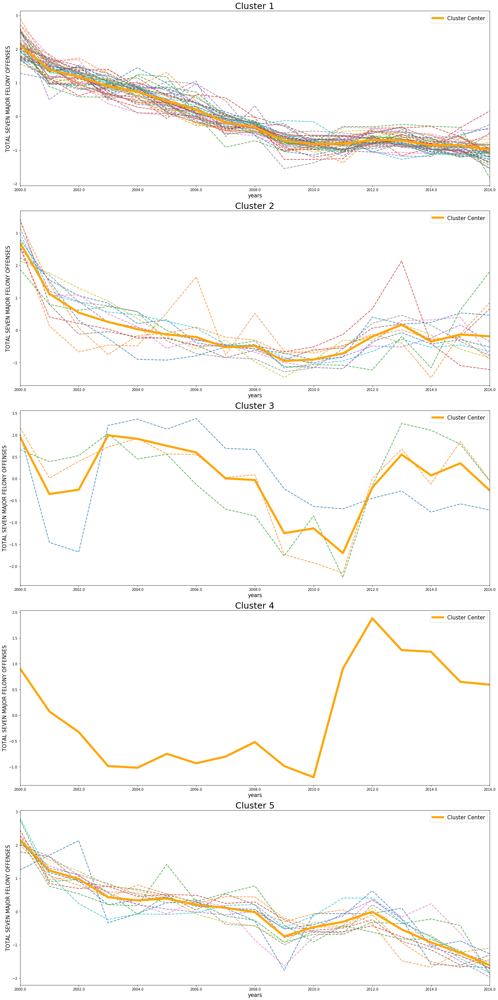

In [152]:
# Plotting the cluster centers
n = 5
fig = plt.figure(figsize=(4*n,8*n))
for i in range(n):
    ax = fig.add_subplot(n,1,i+1)
    X.iloc[res.labels_==i].T.plot(ax=ax,alpha=0.8,style='--',lw=2.0)
    l = ax.plot(res.cluster_centers_[i],lw=6.0,color='Orange')
    ax.set_title('Cluster {}'.format(i+1),fontsize=25)
    ax.legend((l),('Cluster Center',),fontsize=15)
    ax.set_xlabel('years',fontsize=15)
    ax.set_ylabel('TOTAL SEVEN MAJOR FELONY OFFENSES',fontsize=15)
fig.tight_layout()
plt.show()

###### fig 10: time series plots for the total crime row for each precinct after clustering. The number of cluster centers is 5 hence there are 5 plots in total. The cluster centers are highlighted in bolded yellow lines in each plot. 

#### Discussion: 
* Time Series in cluster 1 demonstrate an obvious downward trend and have the least fluctuations compared with other clusters. Also the number of time series belonging to this cluster is the largest among the five, and the series show the strongest conformity.
* In cluster 2, the cluster center has a speeded up decrease during 2000 to 2006, reaching the trough in 2009, and then experiences a slight bouncing back and finally oscilates around the value of 0. The series in this cluster roughly follow the behaviour described above, but a few of them demonstrate drastic fluctuation. 
* The series in cluster 3 oscilate violently around 0, but there is no significant drop in the overall trend.
* There is only one time series in this cluster, the cluster center itself. It has the biggest structure among all series, which is a sharp increase from 2010 to 2012. Before the structure, it first plummets from 2000 to 2003 and then experences fluctuation for 7 years. After reaching its peak in 2012, it then dramatically decreases to a value near the neginning value.
* Cluster 5 has a very strong similarity to cluster 1 in terms of overall trends, but shows more fluctuations than cluster 1.

# FBB good except you never discussed why 5 cluster, not before clustering or in the light of the clusters behavior: for example if cluster 5 is very similar to 1 is it actually separated? in fact the reason why it is smootther is that there are more lightcurves in it so you average over more datapoints to construct the center. it is the 2012 bump that distinguishes it from cluster 1

# task 1.5 7/10 (-5 for no discussion of cluster numbers , +2 for good discussion of trends)

# Part 2: connecting the temporal and spatial components.
## 2.1 obtain the NYC precincts geometry and read it in as a shapefile           
(see [the data tips](https://github.com/fedhere/PUI2017_fb55/blob/master/final/PUI2017final_DATA.ipynb))

In [153]:
site = 'https://data.cityofnewyork.us/api/geospatial/78dh-3ptz?method=export&format=Shapefile'
urllib.urlretrieve(site,"precinct_shapefile.zip")

('precinct_shapefile.zip', <httplib.HTTPMessage instance at 0x7fdca3e7f0e0>)

In [154]:
zip_ref = zipfile.ZipFile("precinct_shapefile.zip", 'r')
zip_ref.extractall(os.getenv('PUIDATA')+'/hh1827/')
zip_ref.close()

# FBB adding '/hh1827/' defeats the point of agreeing on an environmental variable! now that path is unique to you, cause I do not have a '/hh1827/' folder. 

In [155]:
# read in the shapefile as gedataframe. this code is cited from my HW9.
precinct_shp =  gpd.GeoDataFrame.from_file(os.getenv('PUIDATA')+'/hh1827/'+ 
                        [file for file in os.listdir(os.getenv ('PUIDATA')+ "/hh1827/")\ 
                                        if "geo_export_" in file and ".shp" in file][0])
precinct_shp.head(3)

SyntaxError: unexpected character after line continuation character (<ipython-input-155-5d1cbd9d2563>, line 3)

# FBB wrong cell, syntax error

In [156]:
# read in the shapefile as gedataframe. this code is cited from my HW9.
precinct_shp =  gpd.GeoDataFrame.from_file(os.getenv('PUIDATA')+'/hh1827/'+ 
                        [file for file in os.listdir(os.getenv ('PUIDATA')+ "/hh1827/") 
                                        if "geo_export_" in file and ".shp" in file][0])
precinct_shp.head(3)

,precinct,shape_leng,shape_area,geometry
0,1.0,80586.154615,4.730176e+07,(POLYGON ((-74.0438776157395 40.69018767637665...
1,5.0,18676.124259,1.808880e+07,POLYGON ((-73.98863862848766 40.72293372026369...
2,6.0,27182.610113,2.213193e+07,POLYGON ((-73.99968392160721 40.73855224865976...


# task 2.1 8/10

In [157]:
precinct_shp.tail(3)

,precinct,shape_leng,shape_area,geometry
74,121.0,138115.721207,4.757161e+08,(POLYGON ((-74.15945602438185 40.6414483333240...
75,122.0,154881.006310,4.547993e+08,(POLYGON ((-74.05050806403284 40.5664220346634...
76,123.0,120885.302710,4.608638e+08,POLYGON ((-74.16982656393461 40.56107800369057...


# FBB nothing after this cell is rendered! 

## 2.2 merge the precincts geodataframe with the dataframe of crime that you used to cluster the time series and plot a choropleth of the clusters. 
Discuss if you see spatial coherence - does the geographical information help interpret the trends you see in time domain?

In [158]:
# making the precincts in th two dataset are the same data dype, preparing for merging
precinct_shp["precinct"] = precinct_shp["precinct"].astype(float)

In [159]:
totcrime["PCT"] = totcrime["PCT"].astype(float)

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


# FBB PCTs should be integer, why convert both to float instead of int??

In [161]:
data = pd.merge(totcrime, precinct_shp, left_on='PCT', right_on='precinct')
data.head()

,PCT,CRIME,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,...,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,precinct,shape_leng,shape_area,geometry
0,1.0,TOTAL SEVEN MAJOR FELONY OFFENSES,3438.0,3069.0,2715.0,2649.0,2383.0,2305.0,2013.0,1914.0,...,1402.0,1416.0,1416.0,1208.0,1446.0,1395.0,1.0,80586.154615,4.730176e+07,(POLYGON ((-74.0438776157395 40.69018767637665...
1,5.0,TOTAL SEVEN MAJOR FELONY OFFENSES,1780.0,1458.0,1309.0,1231.0,1170.0,1131.0,1040.0,1031.0,...,962.0,1001.0,980.0,870.0,917.0,899.0,5.0,18676.124259,1.808880e+07,POLYGON ((-73.98863862848766 40.72293372026369...
2,6.0,TOTAL SEVEN MAJOR FELONY OFFENSES,2387.0,2141.0,2059.0,2068.0,2174.0,2055.0,1979.0,1837.0,...,1504.0,1574.0,1703.0,1575.0,1521.0,1388.0,6.0,27182.610113,2.213193e+07,POLYGON ((-73.99968392160721 40.73855224865976...
3,7.0,TOTAL SEVEN MAJOR FELONY OFFENSES,990.0,892.0,908.0,864.0,857.0,804.0,864.0,856.0,...,704.0,762.0,711.0,732.0,781.0,823.0,7.0,17301.308682,1.836402e+07,"POLYGON ((-73.97345389423181 40.718962954076, ..."
4,9.0,TOTAL SEVEN MAJOR FELONY OFFENSES,2115.0,1672.0,1809.0,1801.0,1747.0,1664.0,1579.0,1519.0,...,1350.0,1419.0,1424.0,1331.0,1337.0,1463.0,9.0,19773.233410,2.139423e+07,POLYGON ((-73.97160900246391 40.72672340116989...


In [162]:
# dropping redundant columns
data.drop('PCT', axis=1, inplace=True)
data.head(1)

,CRIME,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,...,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,precinct,shape_leng,shape_area,geometry
0,TOTAL SEVEN MAJOR FELONY OFFENSES,3438.0,3069.0,2715.0,2649.0,2383.0,2305.0,2013.0,1914.0,1708.0,...,1402.0,1416.0,1416.0,1208.0,1446.0,1395.0,1.0,80586.154615,4.730176e+07,(POLYGON ((-74.0438776157395 40.69018767637665...


In [163]:
# converting the merged dataframe to geodataframe
data = gpd.GeoDataFrame(data, geometry='geometry')
type(data)

geopandas.geodataframe.GeoDataFrame

# FBB ok, you are doing things in very convoluted ways. you had a geodf: precinct_shp - all you had to do was use the geodf.merge and you would have not had to convert back and forth:
    precinct_shp(totcrime, left_on='precinct', right_on='PCT')

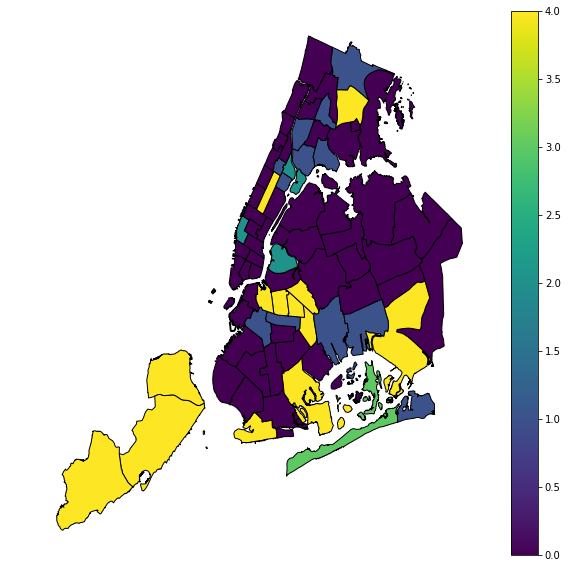

In [164]:
# plot a choropleth of the clusters on NYC precinct map
n = 5
dd=X    
plot = data

km=KMeans(random_state=324,n_clusters=n)
res=km.fit(dd)
    
se = pd.Series(res.labels_)
plot['label'] = se.values  

fig = plt.figure(figsize=[10, 10])
ax = fig.add_subplot(111)
plot.plot(column="label", ax=ax, edgecolor="black", legend =True, lw=1)
ax.axis("off")
plt.show()

###### fig11: a choropleth map of clustered total crime data.

# FBB use "discrete" to get teh right color bar. 

#### merge the precincts geodataframe with the dataframe of crime that you used to cluster the time series and plot a choropleth of the clusters.Discuss if you see spatial coherence - does the geographical information help interpret the trends you see in time domain?

#### Discussion: the cluster labels are: 0, 1, 2, 3, 4, which correspond to cluster 1 to 5 respectively. Label 0 covers the largest area in the map, which agrees with the fact that cluster 1 has the largest number of time series. Only 1 precinct is labeled as 3, which is cluster 4. To understand how the crime rate of each precinct has actually changed from 2000 to 2016 requires plenty of prior knowledge as an old new yorker and a lot of researches, which is beyond my experience and the scope of this project. 

# FBB plenty to discuss here without being an old NYer or having spent a lifetime of research on the topic: spatial coherence - Man Queens and south brooklyn have similar trends. A belt in mid brooklyn nad a different time behavior, similar to that of precincts in the Bx, isloated precincts include rockaway. central park is not isolated, which is suspicious.... etc etc

### EC2 visualize each crime by precinct. here you can choose the visual display that you prefer, but not a time series plot (like you did before) or a coropleth (like you will do later). It could be a box and whiskers plot for example

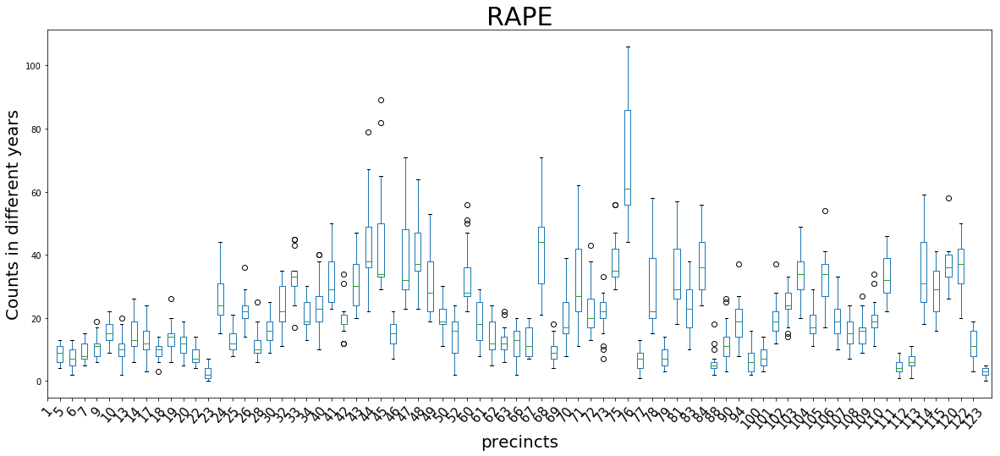

In [165]:
# boxplot for distribution of rape by precinct
rape[1:].plot(kind = "box", figsize=(20,8), legend = None)
pl.xticks(range(76),rape.iloc[0], rotation = 50, fontsize = 15)
plt.xlabel("precincts", fontsize=20)
plt.ylabel("Counts in different years", fontsize = 20)
plt.title("RAPE", fontsize = 30)
plt.show()

###### fig 12: boxplot for distribution of rape by precinct. 

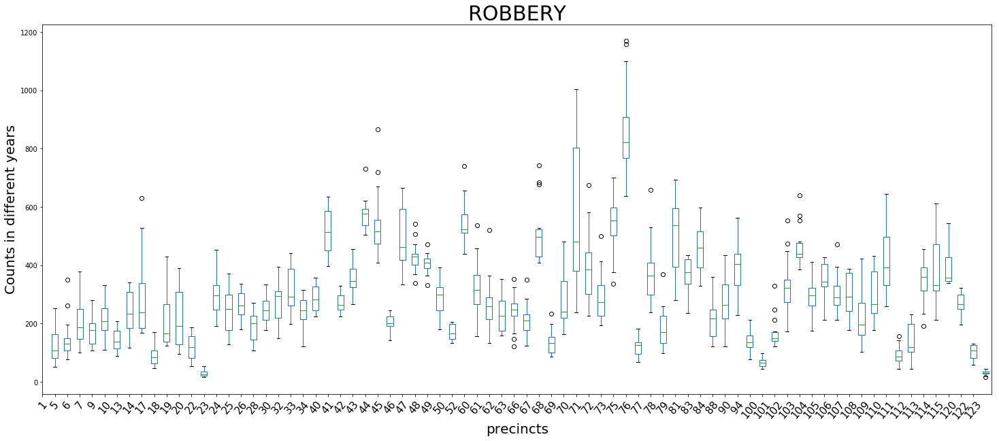

In [166]:
# boxplot for distribution of robbery by precinct
rob[1:].plot(figsize=(25,10), kind ="box", legend = None)
pl.xticks(range(76),rob.iloc[0], rotation = 50, fontsize = 15)
plt.xlabel("precincts", fontsize=20)
plt.ylabel("Counts in different years", fontsize = 20)
plt.title("ROBBERY", fontsize = 30)
plt.show()

###### fig 13: boxplot for distribution of robbery by precinct.

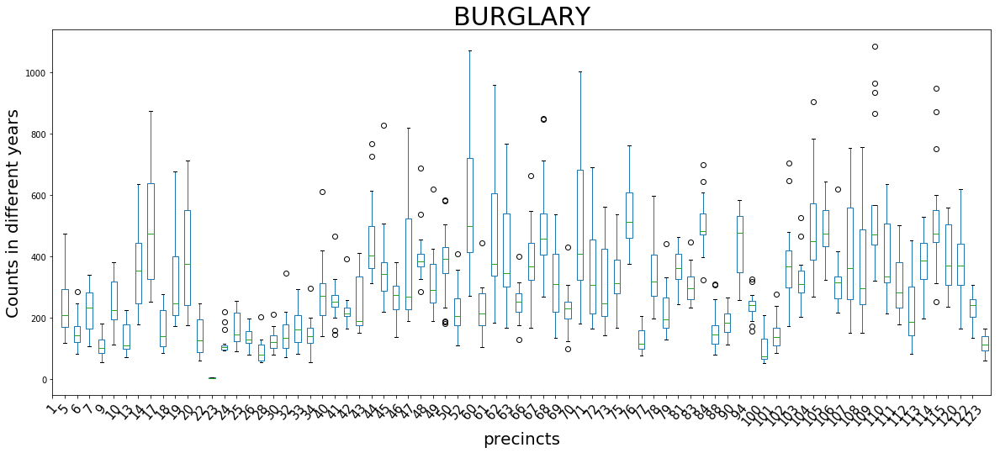

In [167]:
# boxplot for distribution of burglary by precinct
burglary[1:].plot(figsize=(20,8), kind = "box", legend = None)
pl.xticks(range(76),burglary.iloc[0], rotation = 50, fontsize = 15)
plt.xlabel("precincts", fontsize=20)
plt.ylabel("Counts in different years", fontsize = 20)
plt.title("BURGLARY", fontsize = 30)
plt.show()

###### fig 14: boxplot for distribution of burglary by precinct.

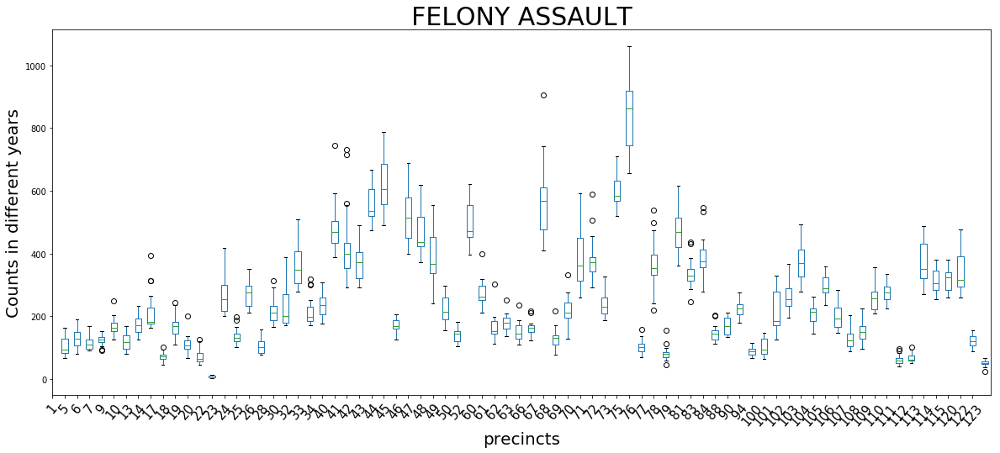

In [168]:
# boxplot for distribution of felony assult by precinct
felony[1:].plot(figsize=(20,8), kind = "box", legend = None)
pl.xticks(range(76),felony.iloc[0], rotation = 50, fontsize = 15)
plt.xlabel("precincts", fontsize=20)
plt.ylabel("Counts in different years", fontsize = 20)
plt.title("FELONY ASSAULT", fontsize = 30)
plt.show()

###### fig 15: boxplot for distribution of felony assult by precinct.

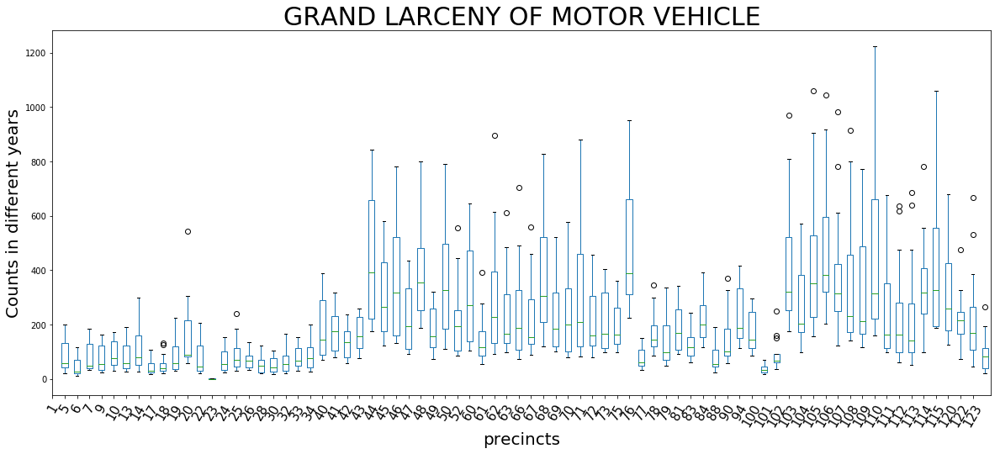

In [169]:
# boxplot for distribution of grand larcency of motor vehicle assult by precinct
MV[1:].plot(figsize=(20,8),kind = "box", legend = None)
pl.xticks(range(76),MV.iloc[0], rotation = 60, fontsize = 15)
plt.xlabel("precincts", fontsize=20)
plt.ylabel("Counts in different years", fontsize = 20)
plt.title("GRAND LARCENY OF MOTOR VEHICLE", fontsize = 30)
plt.show()

###### fig 16: boxplot for distribution of grand larcency of motor vehicle by precinct.

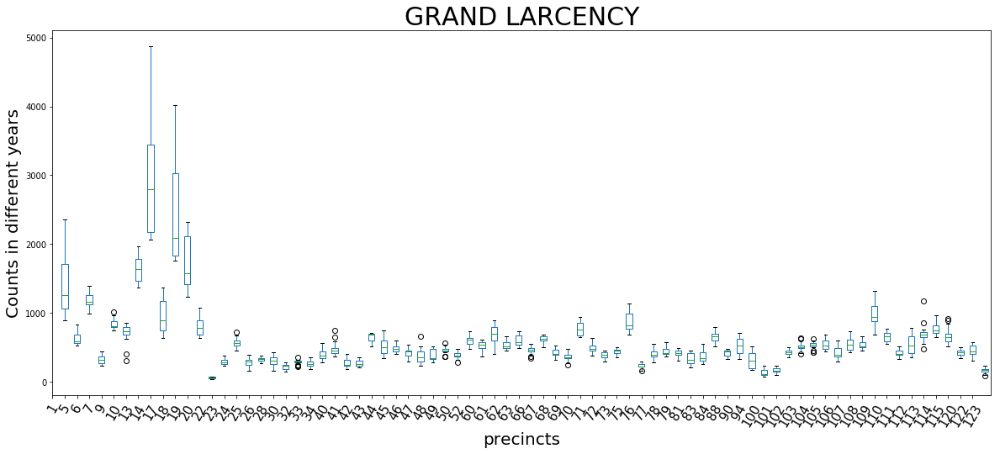

In [170]:
# boxplot for distribution of grand larcency assult by precinct
gl[1:].plot(figsize=(20,8), kind = "box", legend = None)
pl.xticks(range(76),gl.iloc[0], rotation = 60, fontsize = 15)
plt.xlabel("precincts", fontsize=20)
plt.ylabel("Counts in different years", fontsize = 20)
plt.title("GRAND LARCENCY", fontsize = 30)
plt.show()

###### fig 17: boxplot for distribution of grand larcency by precinct.

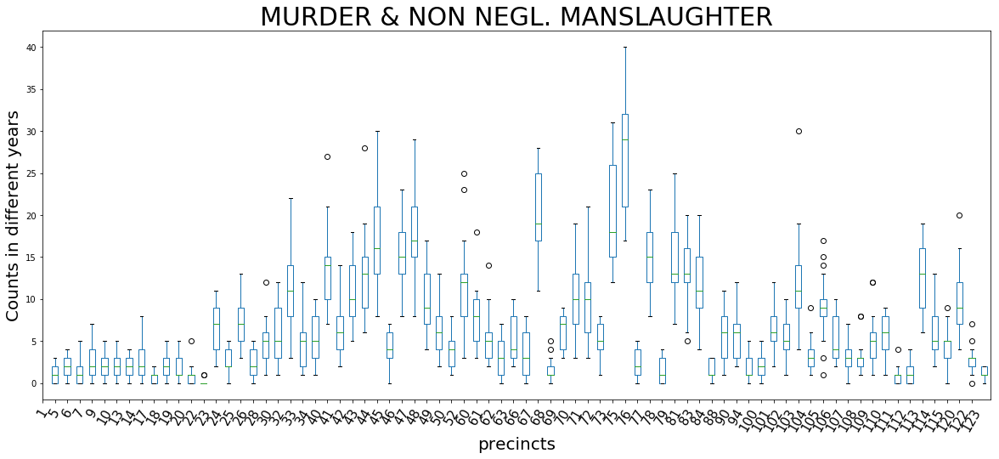

In [171]:
# boxplot for distribution of murder by precinct
murder[1:].plot(figsize=(20,8), kind = "box", legend = None)
pl.xticks(range(76),murder.iloc[0], rotation = 60, fontsize = 15)
plt.xlabel("precincts", fontsize=20)
plt.ylabel("Counts in different years", fontsize = 20)
plt.title("MURDER & NON NEGL. MANSLAUGHTER", fontsize = 30)
plt.show()

###### fig 17: boxplot for distribution of murder by precinct.

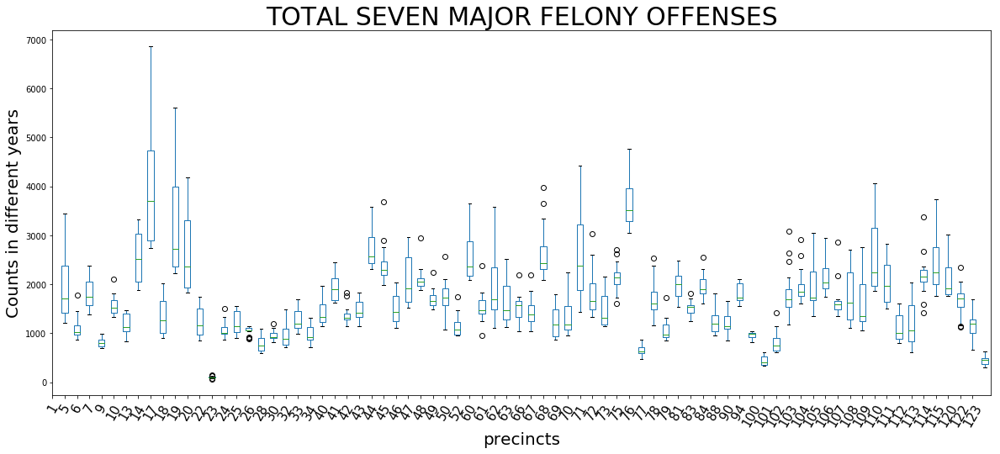

In [172]:
# boxplot of total crime distribution by precinct
tot[1:].plot(figsize=(20,8), kind = "box", legend = None)
pl.xticks(range(76),tot.iloc[0], rotation = 60, fontsize = 15)
plt.xlabel("precincts", fontsize=20)
plt.ylabel("Counts in different years", fontsize = 20)
plt.title("TOTAL SEVEN MAJOR FELONY OFFENSES", fontsize = 30)
plt.show()

###### fig 18: boxplot for distribution of total amount of crime by precinct.

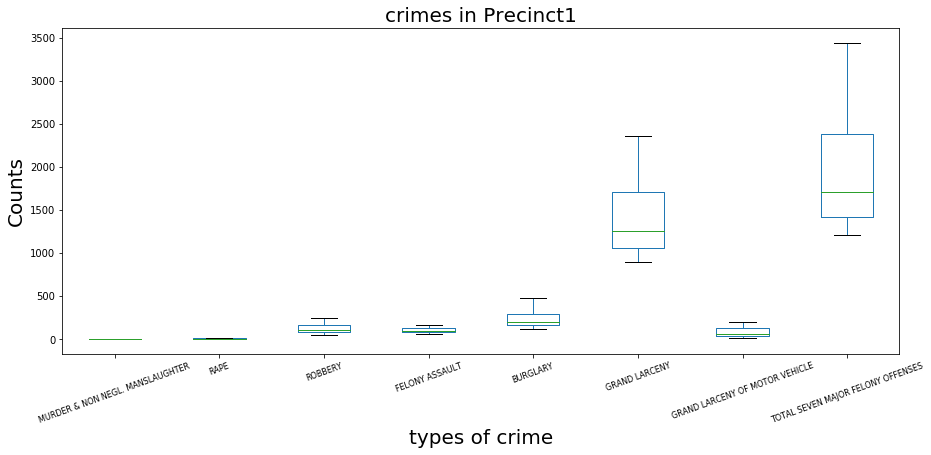

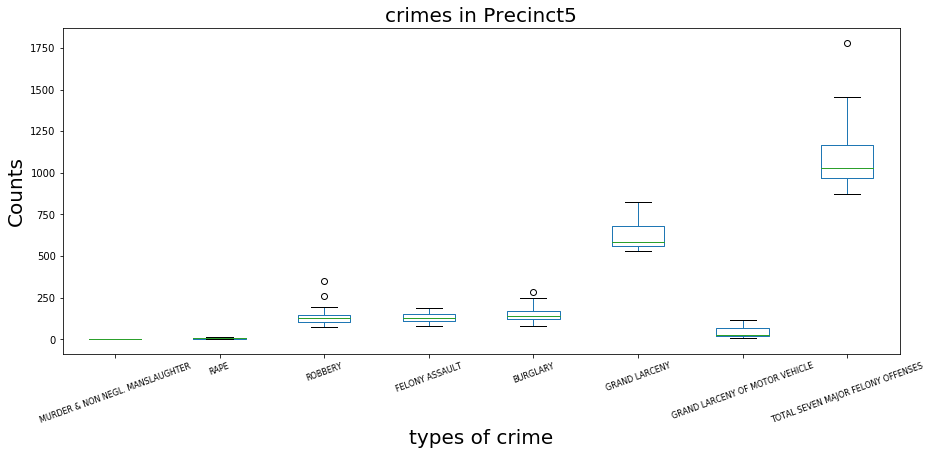

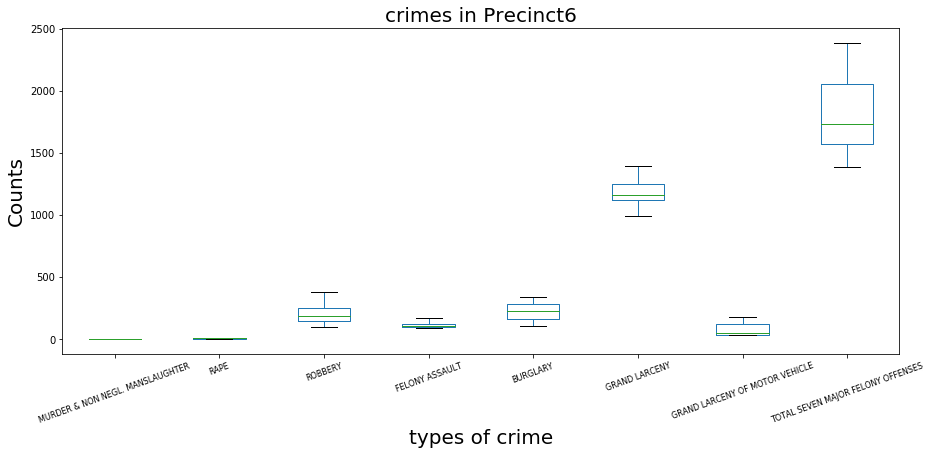

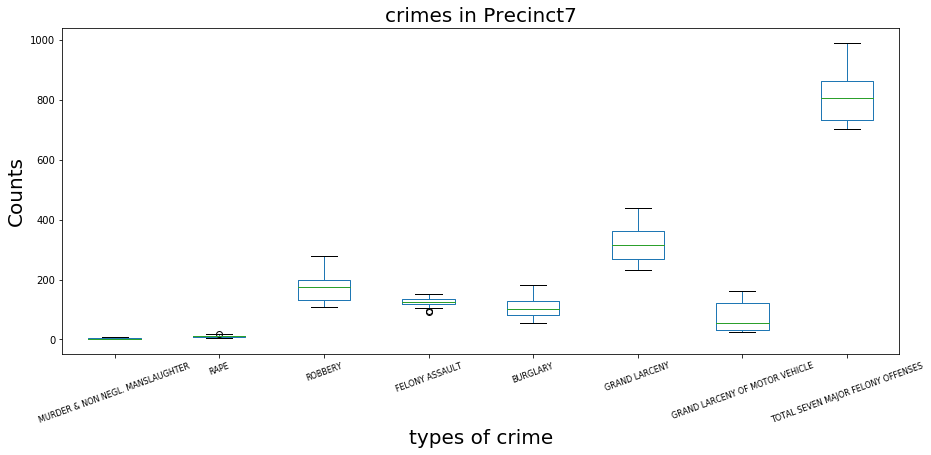

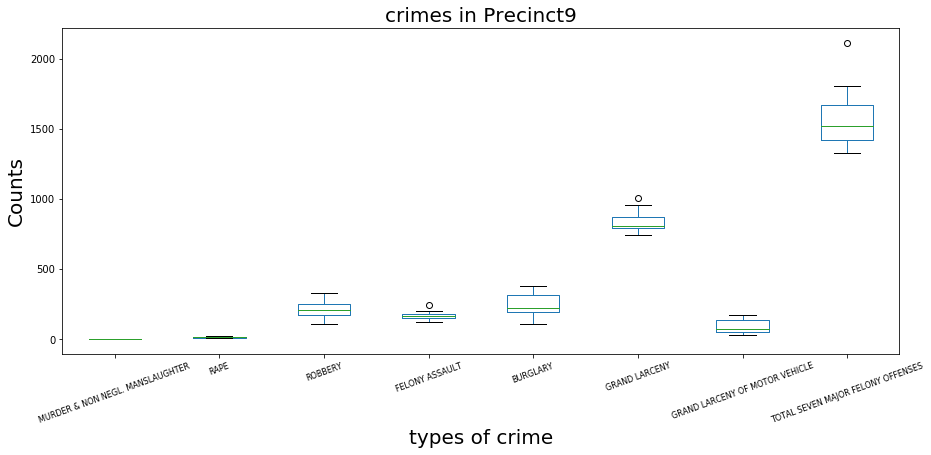

...

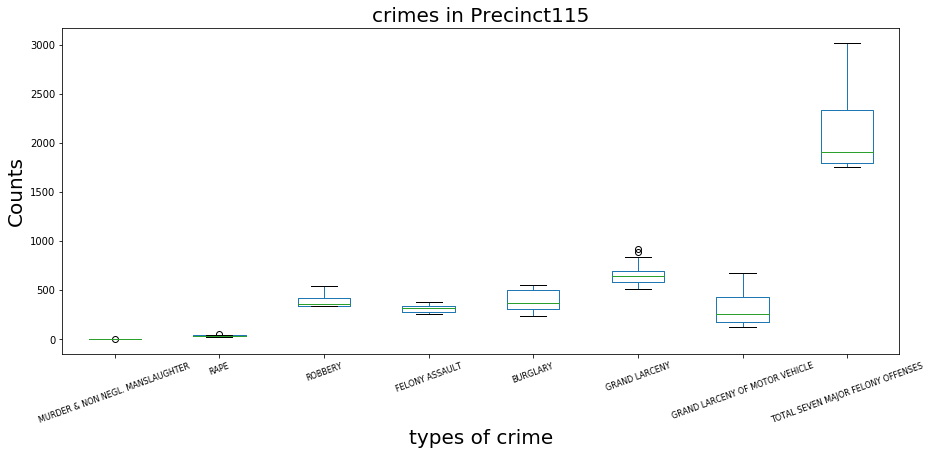

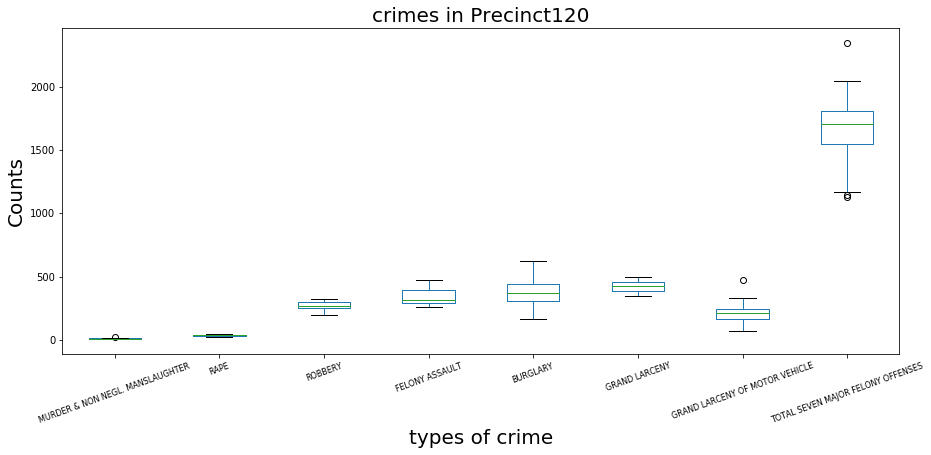

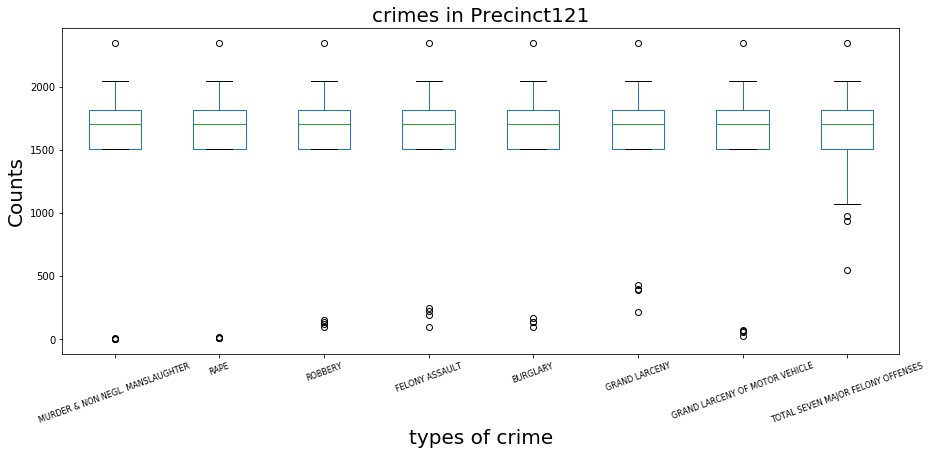

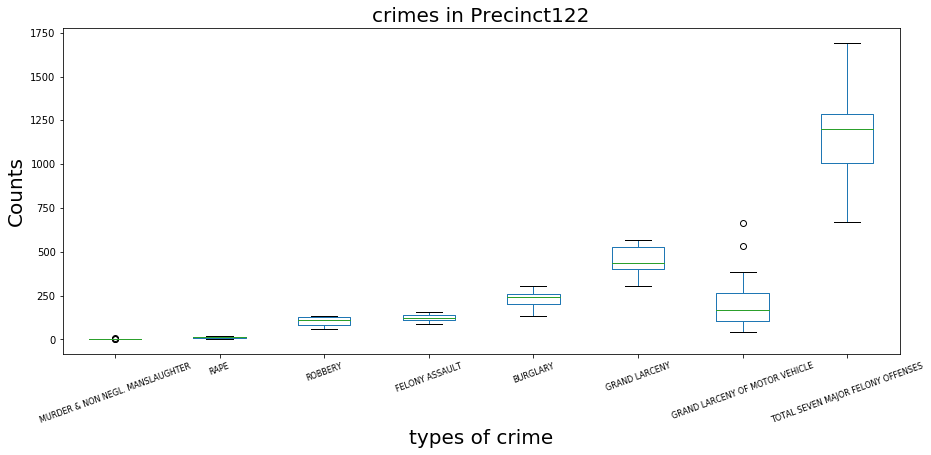

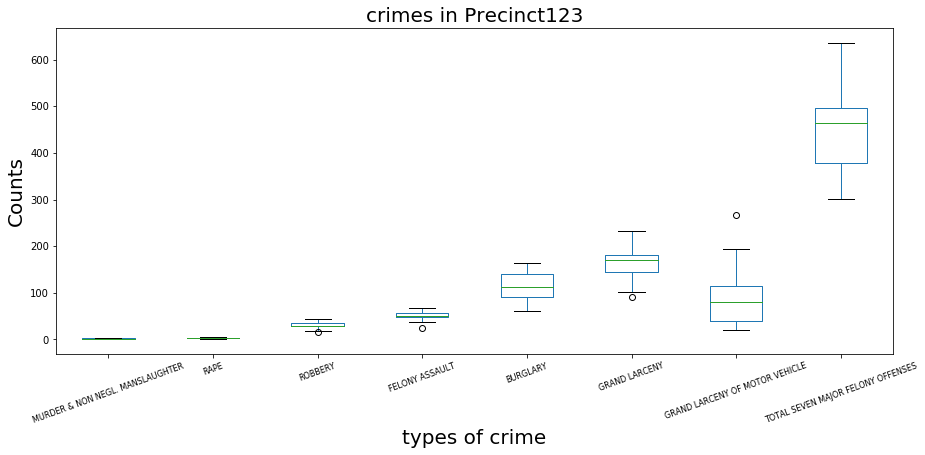

In [173]:
# visualize each crime by precinct using boxplot
for i in range(0, 616, 8):
    
    ax = crime_t.iloc[:,i:i+8][1:].astype(float).plot(kind ="box",figsize=(15, 6))
    ax.set_title("crimes in Precinct" + crime_t.iloc[0,i], fontsize=20)
    pl.xticks(rotation = 20, fontsize = 8)
    pl.xlabel("types of crime", fontsize=20)
    pl.ylabel("Counts", fontsize=20)
    pl.legend(fontsize=10, loc="best")

    plt.show()

###### fig : boxplot for 7 felonies and the total amount of crimes committed in eacch precinct. 

# FBB as usual, plots without interpretation are useless in this class

## 2.3 download the data containing the socioeconomic features to be used as exogenous variables. 
I prepared a file with socioeconomic features for each precinct: unemployed fraction, median income, fraction of the precinct area that is green. Dowload it from https://nyu.carto.com via sql (HW 7) ( ideally only extracting the relevant columns). The source sql is  'https://fb55.carto.com:443/api/v2/sql?q=' , the name of the file  *nycsocioeconomicsbyprecinct*


In [174]:
SQL_SOURCE = 'https://fb55.carto.com:443/api/v2/sql?q='

try:
    from urllib.request import urlopen
except ImportError:
    from urllib2 import urlopen
try:
    from urllib.error import HTTPError
except ImportError:
    from urllib2 import HTTPError
try:
    from urllib.parse import urlencode
except ImportError:
    from urllib import urlencode
import io
import ast
import pandas as pd

def queryCartoDB(query, format='CSV', source=SQL_SOURCE):
    '''queries carto datasets from a given carto account
    Arguments: 
    query - string: a valid sql query string
    format - outlut format  OPTIONAL (default CSV)
    source - a valid sql api endpoint OPTIONAL (default carto fb55 account)
    Returns:
    the return of the sql query AS A STRING
    NOTES:
    designed for the carto API, tested only with CSV return format'''
    
    data = urllib.urlencode({'format': format, 'q': query})
    try:
        response = urllib2.urlopen(source, data)
    except urllib2.HTTPError, e:
        raise ValueError('\n'.join(ast.literal_eval(e.readline())['error']))
    except Exception:
        raise
    return response.read()

# FBB PEP8: all imports should be at the top

In [175]:
import StringIO
import urllib2

In [176]:
data =  '''
SELECT precinct,green, medianincome, unemployment
FROM nycsocioeconomicsbyprecinct
'''

In [177]:
socioeconomics = pd.read_csv(StringIO.StringIO(queryCartoDB(data)), sep=',')

In [178]:
socioeconomics.head()

,precinct,green,medianincome,unemployment
0,1,0.058702,124092.068749,0.021444
1,60,0.173512,35015.008703,0.056448
2,61,0.238375,65998.923662,0.055458
3,63,0.158530,33655.205265,0.031215
4,24,0.166040,113966.467973,0.043461


# FBB 2.3 
# task 2.3 10

## 2.4 *pivot* the crime dataframe so that you have a dataframe with precinct on the index and each crime type on the columns 
This task may be the most unfamiliar. look at the hints for an example on how to do it. If this fails you can download the pivoted file [here](https://github.com/fedhere/PUI2017_fb55/blob/master/final/crimepivoted.csv)

In [179]:
# converting the PCT from string to numbers so that the pivot table can be sorted in ascending order
crime["PCT"] = crime["PCT"].astype(int)

In [180]:
# calculating crime mean for each type of crime
crime['crimemean'] = crime.mean(axis=1)
crime.head()

,PCT,CRIME,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,crimemean
0,1,MURDER & NON NEGL. MANSLAUGHTER ...,3.0,1.0,2.0,2.0,2.0,0.0,1.0,0.0,1.0,2.0,2.0,0.0,1.0,0.0,0.0,1.0,0.0,1.055556
1,1,RAPE,12.0,5.0,10.0,11.0,11.0,5.0,4.0,7.0,12.0,4.0,6.0,13.0,10.0,12.0,8.0,7.0,9.0,8.166667
2,1,ROBBERY,252.0,188.0,210.0,164.0,154.0,172.0,119.0,128.0,108.0,106.0,96.0,102.0,81.0,68.0,50.0,79.0,60.0,118.777778
3,1,FELONY ASSAULT,139.0,164.0,147.0,134.0,129.0,121.0,94.0,90.0,83.0,83.0,68.0,94.0,110.0,87.0,76.0,86.0,78.0,99.111111
4,1,BURGLARY,475.0,437.0,297.0,403.0,246.0,293.0,255.0,231.0,189.0,207.0,170.0,155.0,188.0,171.0,145.0,138.0,117.0,228.777778


# FBB This way the PCt number is included in the average! 

In [181]:
crime.head(10)

,PCT,CRIME,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,crimemean
0,1,MURDER & NON NEGL. MANSLAUGHTER ...,3.0,1.0,2.0,2.0,2.0,0.0,1.0,0.0,1.0,2.0,2.0,0.0,1.0,0.0,0.0,1.0,0.0,1.055556
1,1,RAPE,12.0,5.0,10.0,11.0,11.0,5.0,4.0,7.0,12.0,4.0,6.0,13.0,10.0,12.0,8.0,7.0,9.0,8.166667
2,1,ROBBERY,252.0,188.0,210.0,164.0,154.0,172.0,119.0,128.0,108.0,106.0,96.0,102.0,81.0,68.0,50.0,79.0,60.0,118.777778
3,1,FELONY ASSAULT,139.0,164.0,147.0,134.0,129.0,121.0,94.0,90.0,83.0,83.0,68.0,94.0,110.0,87.0,76.0,86.0,78.0,99.111111
4,1,BURGLARY,475.0,437.0,297.0,403.0,246.0,293.0,255.0,231.0,189.0,207.0,170.0,155.0,188.0,171.0,145.0,138.0,117.0,228.777778
5,1,GRAND LARCENY,2358.0,2117.0,1896.0,1803.0,1708.0,1624.0,1462.0,1395.0,1258.0,1122.0,1065.0,979.0,985.0,1051.0,896.0,1114.0,1081.0,1328.611111
6,1,GRAND LARCENY OF MOTOR VEHICLE ...,199.0,157.0,153.0,132.0,133.0,90.0,78.0,63.0,57.0,54.0,38.0,59.0,41.0,27.0,33.0,21.0,50.0,77.000000
7,1,TOTAL SEVEN MAJOR FELONY OFFENSES,3438.0,3069.0,2715.0,2649.0,2383.0,2305.0,2013.0,1914.0,1708.0,1578.0,1445.0,1402.0,1416.0,1416.0,1208.0,1446.0,1395.0,1861.166667
8,5,MURDER & NON NEGL. MANSLAUGHTER ...,4.0,3.0,0.0,3.0,1.0,4.0,2.0,2.0,2.0,1.0,1.0,0.0,3.0,3.0,2.0,1.0,0.0,2.055556
9,5,RAPE,9.0,3.0,12.0,7.0,7.0,13.0,5.0,4.0,2.0,6.0,10.0,11.0,12.0,5.0,4.0,10.0,8.0,7.388889


In [182]:
# generating pivot table with PCT as index and types of crimes as columns
crimepivot = crime.pivot(index='PCT',columns='CRIME',values='crimemean')  
crimepivot.head()

CRIME,BURGLARY,FELONY ASSAULT,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,TOTAL SEVEN MAJOR FELONY OFFENSES
PCT,,,,,,,,
1,228.777778,99.111111,1328.611111,77.000000,1.055556,8.166667,118.777778,1861.166667
5,144.722222,123.944444,582.833333,43.611111,2.055556,7.388889,139.166667,1042.055556
6,213.388889,108.333333,1117.611111,77.888889,1.555556,9.277778,189.055556,1715.111111
7,102.555556,117.888889,300.111111,70.388889,2.833333,10.500000,162.833333,764.777778
9,234.611111,160.722222,787.388889,85.055556,2.666667,15.111111,197.666667,1480.222222


In [183]:
# sorting the PCT in ascending order
crimepivot = crimepivot.sort_index()
crimepivot.head()

CRIME,BURGLARY,FELONY ASSAULT,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,TOTAL SEVEN MAJOR FELONY OFFENSES
PCT,,,,,,,,
1,228.777778,99.111111,1328.611111,77.000000,1.055556,8.166667,118.777778,1861.166667
5,144.722222,123.944444,582.833333,43.611111,2.055556,7.388889,139.166667,1042.055556
6,213.388889,108.333333,1117.611111,77.888889,1.555556,9.277778,189.055556,1715.111111
7,102.555556,117.888889,300.111111,70.388889,2.833333,10.500000,162.833333,764.777778
9,234.611111,160.722222,787.388889,85.055556,2.666667,15.111111,197.666667,1480.222222


In [184]:
# resetting index
crimepivot = crimepivot.reset_index()
crimepivot.head()

CRIME,PCT,BURGLARY,FELONY ASSAULT,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,TOTAL SEVEN MAJOR FELONY OFFENSES
0,1,228.777778,99.111111,1328.611111,77.000000,1.055556,8.166667,118.777778,1861.166667
1,5,144.722222,123.944444,582.833333,43.611111,2.055556,7.388889,139.166667,1042.055556
2,6,213.388889,108.333333,1117.611111,77.888889,1.555556,9.277778,189.055556,1715.111111
3,7,102.555556,117.888889,300.111111,70.388889,2.833333,10.500000,162.833333,764.777778
4,9,234.611111,160.722222,787.388889,85.055556,2.666667,15.111111,197.666667,1480.222222


In [185]:
# for the convenience of merging and plotting 
crimepivot["precinct"] = crimepivot["PCT"]
# removing the space in headers
crimepivot.columns = crimepivot.columns.str.strip()
crimepivot.head(2)

CRIME,PCT,BURGLARY,FELONY ASSAULT,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,TOTAL SEVEN MAJOR FELONY OFFENSES,precinct
0,1,228.777778,99.111111,1328.611111,77.000000,1.055556,8.166667,118.777778,1861.166667,1
1,5,144.722222,123.944444,582.833333,43.611111,2.055556,7.388889,139.166667,1042.055556,5


# FBB I gave you a notebook to compare. the mean column is different for total felonis cause of isse when taking mean
# task 2.4 5/10

## 2.5 merge the dataframe with the socioeconomic data with the pivoted crime data,  and merge the precinct geodataframe with it. plot a choropleth of each of the 7 felonies, plus the total crime by precinct
clean up your data so that the only columns left are the 7 felonies, the total number of felonies, and the socioeconomic features (unemployment, median income, park access). I recommend you rename the crime features: the dataframes have very annoying white spaces encoded in them. See the hints file to remove them.

In [186]:
socioeconomics.head(2)

,precinct,green,medianincome,unemployment
0,1,0.058702,124092.068749,0.021444
1,60,0.173512,35015.008703,0.056448


In [187]:
# converting the precinct number in socioeconomic data into the same type as pivot table
socioeconomics["precinct"] = socioeconomics["precinct"].astype(int)

In [188]:
# merging the socioeconomic data with pivot table
merge1 = pd.merge(socioeconomics, crimepivot, left_on = 'precinct', right_on = 'precinct')
merge1.head()

,precinct,green,medianincome,unemployment,PCT,BURGLARY,FELONY ASSAULT,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,TOTAL SEVEN MAJOR FELONY OFFENSES
0,1,0.058702,124092.068749,0.021444,1,228.777778,99.111111,1328.611111,77.000000,1.055556,8.166667,118.777778,1861.166667
1,60,0.173512,35015.008703,0.056448,60,221.111111,260.722222,494.277778,146.611111,10.611111,20.777778,317.388889,1451.500000
2,61,0.238375,65998.923662,0.055458,61,423.888889,161.666667,644.000000,296.555556,8.444444,15.888889,257.944444,1788.055556
3,63,0.158530,33655.205265,0.031215,63,238.888889,148.555556,563.833333,241.666667,8.222222,15.333333,232.111111,1427.611111
4,24,0.166040,113966.467973,0.043461,24,154.722222,131.388889,537.888889,87.722222,3.833333,13.388889,225.833333,1146.777778


In [189]:
merge1["precinct"] = merge1["precinct"].astype(float)

In [190]:
# merging with precinct shapefile
merge2 = pd.merge(merge1, precinct_shp, left_on = 'precinct', right_on = 'precinct')
merge2.head(2)

,precinct,green,medianincome,unemployment,PCT,BURGLARY,FELONY ASSAULT,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,TOTAL SEVEN MAJOR FELONY OFFENSES,shape_leng,shape_area,geometry
0,1.0,0.058702,124092.068749,0.021444,1,228.777778,99.111111,1328.611111,77.000000,1.055556,8.166667,118.777778,1861.166667,80586.154615,4.730176e+07,(POLYGON ((-74.0438776157395 40.69018767637665...
1,60.0,0.173512,35015.008703,0.056448,60,221.111111,260.722222,494.277778,146.611111,10.611111,20.777778,317.388889,1451.500000,66232.695580,8.821587e+07,POLYGON ((-73.98372152681179 40.59582107821716...


In [191]:
# cleaning up the data
merge2.drop(["PCT", "shape_leng", "shape_area"], axis=1, inplace = True)
merge2.head(2)

,precinct,green,medianincome,unemployment,BURGLARY,FELONY ASSAULT,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,TOTAL SEVEN MAJOR FELONY OFFENSES,geometry
0,1.0,0.058702,124092.068749,0.021444,228.777778,99.111111,1328.611111,77.000000,1.055556,8.166667,118.777778,1861.166667,(POLYGON ((-74.0438776157395 40.69018767637665...
1,60.0,0.173512,35015.008703,0.056448,221.111111,260.722222,494.277778,146.611111,10.611111,20.777778,317.388889,1451.500000,POLYGON ((-73.98372152681179 40.59582107821716...


In [192]:
# dropping the space in headers
merge2.columns = merge2.columns.str.strip()
merge2.columns

Index([u'precinct', u'green', u'medianincome', u'unemployment', u'BURGLARY',
       u'FELONY ASSAULT', u'GRAND LARCENY', u'GRAND LARCENY OF MOTOR VEHICLE',
       u'MURDER & NON NEGL. MANSLAUGHTER', u'RAPE', u'ROBBERY',
       u'TOTAL SEVEN MAJOR FELONY OFFENSES', u'geometry'],
      dtype='object')

In [193]:
# converting the merged data to geodataframe for plotting
plot = gpd.GeoDataFrame(merge2, geometry = "geometry")
type(plot)

geopandas.geodataframe.GeoDataFrame

In [194]:
crimes = ["BURGLARY", "FELONY ASSAULT", "GRAND LARCENY", 
          "GRAND LARCENY OF MOTOR VEHICLE", "MURDER & NON NEGL. MANSLAUGHTER",
          "RAPE", "ROBBERY", "TOTAL SEVEN MAJOR FELONY OFFENSES"]

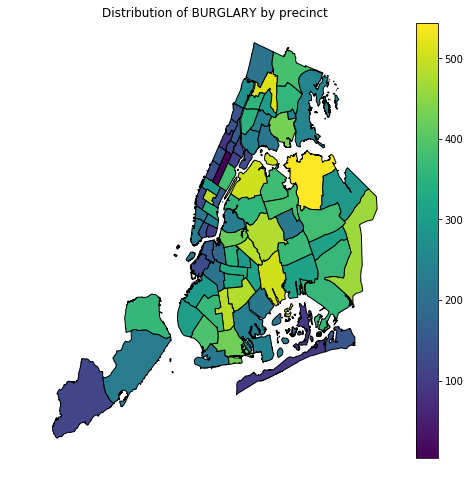

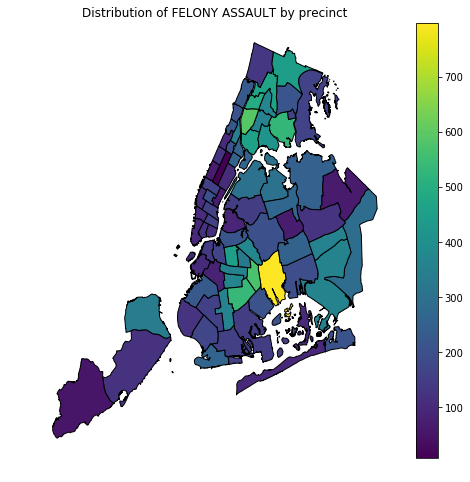

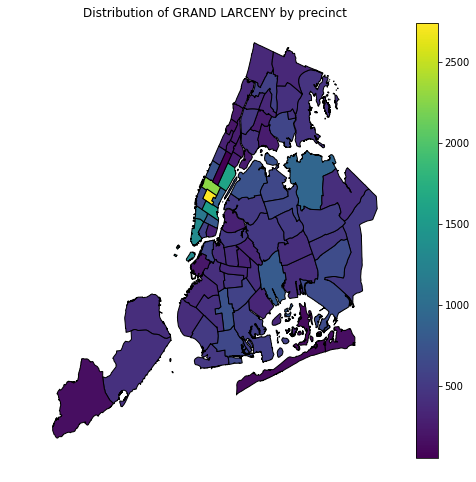

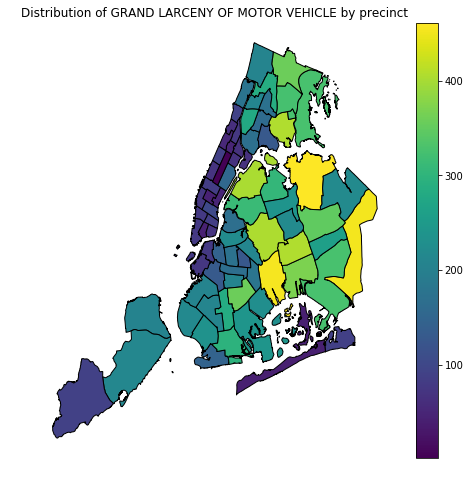

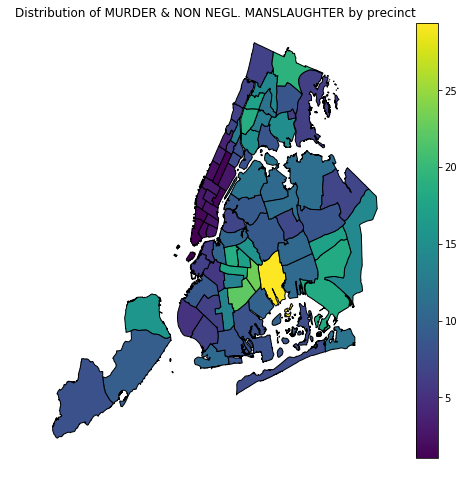

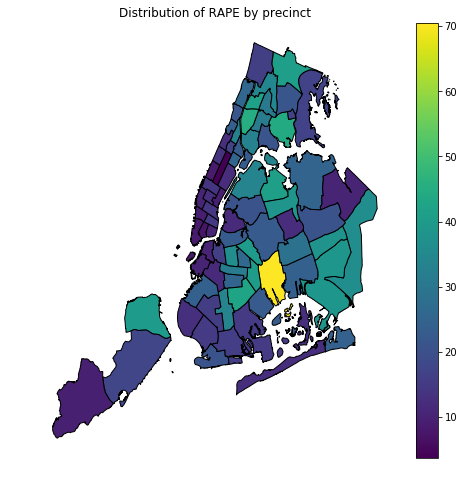

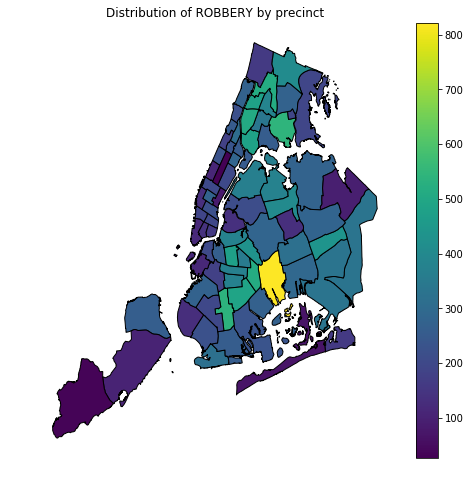

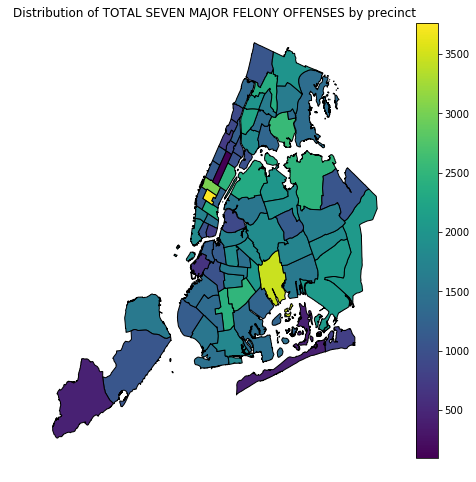

In [195]:
# plotting
for item in crimes:
    fig = plt.figure(figsize=[8,8])
    ax = fig.add_subplot(111)
    plot.plot(column=item, ax=ax, edgecolor="black", legend =True, lw=1)
    ax.set_title("Distribution of " + item + " by precinct")
    ax.axis("off")
    plt.show()

###### fig 12: a choropleth map of the distribution of the mean vlaues 7 felonies and the aggregated amount of crime by precinct. 

# FBB no discussion. 
# task 2.5 5/10

## 2.6 cluster the data first using the socioeconomic features and then using the 7 felonies 
You can use a simple Euclidean distance, since these are all numerical features, which is the default for most packages, or define your distance. if you do that, which would be exciting, please justify your distance definition. Mind the preprocessing! Do the clusters make sense?, is the grouping preserved? are the outliers outliers in both clustering schemes?

In [196]:
from sklearn import preprocessing
from sklearn import cluster

In [197]:
# first cluster according to socioeconomic features
socio = merge2[["green","medianincome", "unemployment"]]

In [198]:
Xscaled = preprocessing.scale(socio)

In [199]:
# preprocessed by stadndardizing by column
Xscaled.std(axis=0), Xscaled.std(axis=1)

(array([ 1.,  1.,  1.]),
 array([ 1.25094683,  0.45560965,  0.43430725,  0.54006905,  0.80985694,
         0.76242906,  0.48492908,  0.76322717,  0.27287856,  0.42981468,
         0.82212385,  0.68424402,  1.15349848,  0.95128002,  0.5007939 ,
         0.46090348,  0.44391207,  0.26192255,  0.66900793,  0.68325296,
         0.72277957,  0.55317828,  0.35133907,  0.59095265,  0.47801401,
         0.1107628 ,  0.30028578,  0.28081045,  0.24854804,  0.47206611,
         0.71380348,  1.29645629,  0.51243642,  0.13046085,  0.03796212,
         1.13304819,  0.2071481 ,  1.2293344 ,  1.11371841,  1.05938126,
         1.12733296,  0.97517042,  1.43753639,  3.66418502,  0.10396558,
         0.57921748,  0.8291992 ,  1.05024404,  0.80774422,  0.97861507,
         1.00729492,  0.79251964,  0.81778566,  0.57479704,  1.11387272,
         0.61411198,  1.07860306,  1.04958143,  1.02476759,  0.88179473,
         0.26322717,  0.14456257,  0.31914014,  1.07066997,  0.1523029 ,
         0.63955569,  0.36

In [200]:
# preprocessed by stadndardizing by row
Xscaled2 = preprocessing.scale(socio, axis=1)
Xscaled2.std(axis=0), Xscaled2.std(axis=1)

(array([ 0.01985425,  0.00151575,  0.0183385 ]),
 array([ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
         1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
         1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
         1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
         1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
         1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.]))

In [201]:
# K-Means clustering: the essential parameter is the number of clusters.
Nc = 5
km_socio = cluster.KMeans(n_clusters=Nc, random_state=234)
km_socio.fit(Xscaled)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=234, tol=0.0001, verbose=0)

In [202]:
km_socio.labels_

array([1, 0, 0, 4, 1, 3, 4, 1, 4, 0, 0, 3, 0, 3, 4, 3, 3, 4, 3, 3, 3, 4, 4,
       0, 4, 4, 4, 4, 4, 4, 1, 1, 3, 4, 4, 1, 4, 1, 1, 1, 1, 1, 1, 2, 4, 3,
       3, 0, 0, 3, 3, 3, 3, 3, 1, 3, 3, 0, 0, 3, 4, 4, 4, 0, 4, 1, 4, 4, 4,
       4, 3, 4, 0, 4, 4, 4], dtype=int32)

In [203]:
km_socio.cluster_centers_

array([[ 1.30016226, -0.36285735, -0.04544834],
       [-0.42850004,  1.63799921, -0.64062065],
       [ 6.18299903, -1.59246107,  6.17789676],
       [-0.41406954, -0.92839669,  0.70766276],
       [-0.25877775,  0.05457566, -0.37300286]])

In [204]:
socio['clusters'] = km_socio.labels_
socio.head(2)

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


,green,medianincome,unemployment,clusters
0,0.058702,124092.068749,0.021444,1
1,0.173512,35015.008703,0.056448,0


In [205]:
# plotting the crime feature clustering on a chloropleth map
plot_socio_ = precinct_shp
plot_socio_["label"] = socio['clusters']
fig = plt.figure(figsize=[10, 10])
ax = fig.add_subplot(111)
plot_cr_.plot(column="label", ax=ax, edgecolor="black", legend =True, lw=1)
ax.axis("off")
plt.show()

NameError: name 'plot_cr_' is not defined

# FBB second broken cell

###### fig 13: Chloropleth map of precincts in NYC clustered in accordance with three socioeconomic features: unemployment, median income and gren space percentage. 

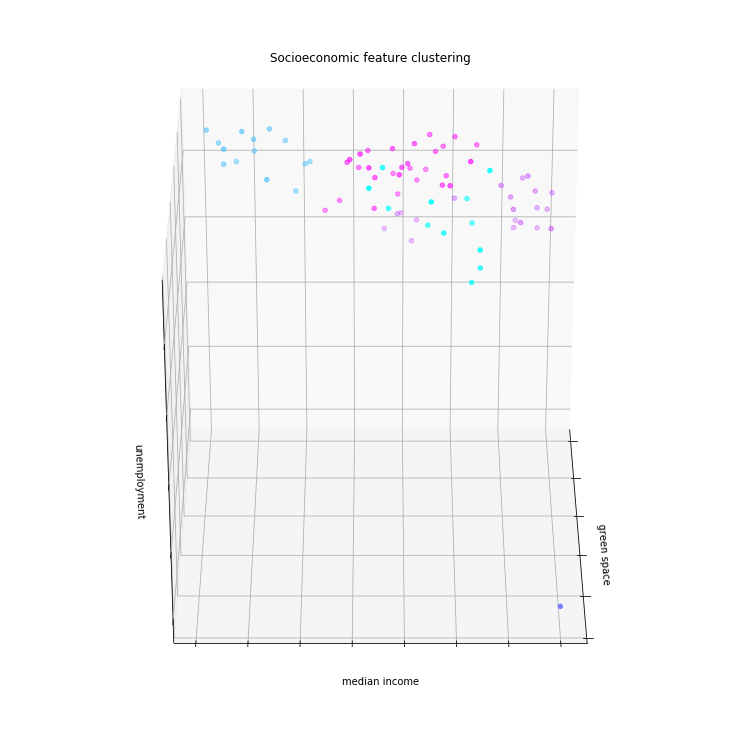

In [206]:
# scatter plot of the clustering by economic features
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(1, figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=180)
ax.scatter(socio.iloc[:, 0], socio.iloc[:, 1], socio.iloc[:, 2], c= socio['clusters'],
           cmap=plt.cm.cool)
ax.set_title("Socioeconomic feature clustering")
ax.set_xlabel("green space")
ax.w_xaxis.set_ticklabels([])
ax.set_ylabel("median income")
ax.w_yaxis.set_ticklabels([])
ax.set_zlabel("unemployment")
ax.w_zaxis.set_ticklabels([])

plt.show()

###### fig 14: 3D scatter plot of the precincts clustered by socioeconomic features.

# FBB when using 3d plot in 3 different angles. I cannot tell the depth. red and green seem mixed in this ploit

##### Discussion: The cluster labels seem to make strong sense since generally speaking points in each color gathers with its own kind, although there are some minor overlays between purple and cyan points. There is one prominent outlier which is labeled as dark blue and located near one of the intersects of the three axis. 

In [207]:
# clustering accoding to the crime features
cr = merge1.drop(["precinct", "green","medianincome", "unemployment", "PCT"], axis = 1)
cr.head()

,BURGLARY,FELONY ASSAULT,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,TOTAL SEVEN MAJOR FELONY OFFENSES
0,228.777778,99.111111,1328.611111,77.000000,1.055556,8.166667,118.777778,1861.166667
1,221.111111,260.722222,494.277778,146.611111,10.611111,20.777778,317.388889,1451.500000
2,423.888889,161.666667,644.000000,296.555556,8.444444,15.888889,257.944444,1788.055556
3,238.888889,148.555556,563.833333,241.666667,8.222222,15.333333,232.111111,1427.611111
4,154.722222,131.388889,537.888889,87.722222,3.833333,13.388889,225.833333,1146.777778


In [208]:
# preprocessed by stadndardizing by column
Yscaled = preprocessing.scale(cr)
Yscaled.std(axis=0), Yscaled.std(axis=1)

(array([ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.]),
 array([ 1.04302739,  0.26026856,  0.58284371,  0.31973371,  0.31962417,
         0.57801237,  0.5383509 ,  0.38450168,  0.5672699 ,  0.33404619,
         0.21162738,  0.57844944,  0.53255101,  0.68506837,  0.49768678,
         0.45487738,  0.26574587,  0.46320554,  0.32704904,  1.09704151,
         0.63652765,  0.2807423 ,  0.41361382,  0.5537946 ,  0.75718647,
         0.67344265,  0.53805749,  0.49961822,  0.86159246,  0.53239798,
         0.4304064 ,  2.19618711,  0.39428333,  0.53665726,  0.39066717,
         0.83144691,  0.25288718,  0.55575124,  0.45858109,  1.13515046,
         0.6779363 ,  1.73472691,  1.23508919,  0.34839583,  0.44341823,
         0.69033558,  0.70040644,  0.47681309,  0.30175672,  0.69790211,
         0.52514426,  0.54903571,  0.74277094,  0.58916118,  0.36669259,
         0.63069129,  0.43725103,  0.27516832,  0.54876454,  0.96856801,
         0.47832665,  0.41495682,  0.43353402,  0.22248475,  0.18120963,
 

In [209]:
# K-Means clustering: the essential parameter is the number of clusters.
Nc = 5
km_cr = cluster.KMeans(n_clusters=Nc, random_state=123)
km_cr.fit(Yscaled)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=123, tol=0.0001, verbose=0)

In [210]:
km_cr.labels_

array([0, 3, 3, 3, 0, 3, 0, 0, 2, 0, 3, 2, 3, 2, 0, 3, 3, 2, 3, 1, 2, 0, 0,
       0, 3, 2, 3, 3, 2, 0, 0, 4, 2, 2, 2, 0, 0, 0, 0, 4, 0, 4, 4, 0, 0, 2,
       3, 0, 0, 2, 3, 3, 2, 2, 0, 2, 3, 0, 2, 2, 3, 3, 0, 0, 3, 0, 2, 3, 0,
       3, 2, 3, 2, 0, 0, 0], dtype=int32)

In [211]:
km_cr.cluster_centers_

array([[-0.96898495, -0.7668879 , -0.24444503, -0.80187283, -0.73421645,
        -0.79444629, -0.8515034 , -0.8648296 ],
       [ 1.74172601,  3.69583566,  0.6265275 ,  2.20226825,  3.42346414,
         3.84455302,  3.86406506,  2.9147925 ],
       [ 0.92796009,  1.07372426, -0.04474837,  0.7787469 ,  1.11062733,
         1.1780814 ,  1.05875573,  0.78694949],
       [ 0.22049042, -0.03003506, -0.30197067,  0.40240283,  0.01692628,
        -0.04947868,  0.05311151, -0.08060598],
       [ 0.73721163, -0.56745018,  3.50017516, -0.8439391 , -1.17902799,
        -0.81967692, -0.37850857,  2.04990191]])

In [212]:
cr['clusters'] = km_cr.labels_
cr.head()

,BURGLARY,FELONY ASSAULT,GRAND LARCENY,GRAND LARCENY OF MOTOR VEHICLE,MURDER & NON NEGL. MANSLAUGHTER,RAPE,ROBBERY,TOTAL SEVEN MAJOR FELONY OFFENSES,clusters
0,228.777778,99.111111,1328.611111,77.000000,1.055556,8.166667,118.777778,1861.166667,0
1,221.111111,260.722222,494.277778,146.611111,10.611111,20.777778,317.388889,1451.500000,3
2,423.888889,161.666667,644.000000,296.555556,8.444444,15.888889,257.944444,1788.055556,3
3,238.888889,148.555556,563.833333,241.666667,8.222222,15.333333,232.111111,1427.611111,3
4,154.722222,131.388889,537.888889,87.722222,3.833333,13.388889,225.833333,1146.777778,0


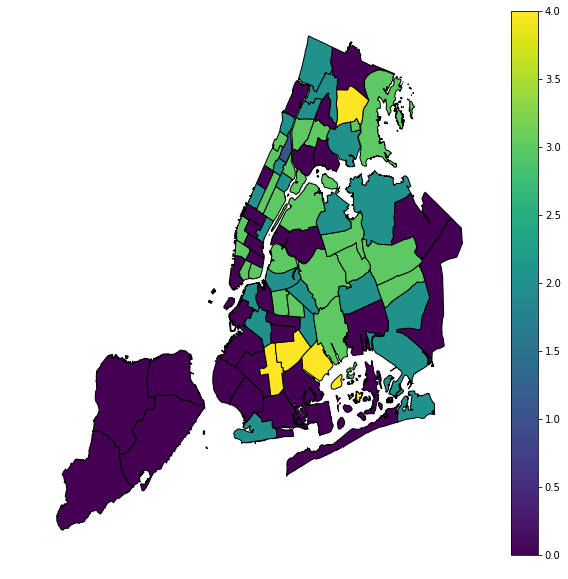

In [213]:
# Plotting the crime features as a chlropleth map
plot_cr_ = precinct_shp
plot_cr_["cr_label"] = cr['clusters']
fig = plt.figure(figsize=[10, 10])
ax = fig.add_subplot(111)
plot_cr_.plot(column="cr_label", ax=ax, edgecolor="black", legend =True, lw=1)
ax.axis("off")
plt.show()

###### fig 15: a choropleth map of the precincts in NYC clustered by crime features: 7 felonies and the total amount of crime

[ 0.81651471  0.1600345   0.01907573]


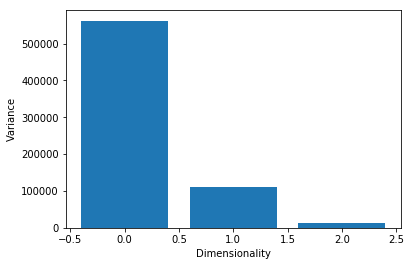

In [214]:
# use PCA to reduce the dimension of crime features from 8 to 
n=3 # how many eigenvectors we choose
from sklearn.decomposition import PCA
pca = PCA(n)
Xproj = pca.fit_transform(cr.iloc[:,:-1])
eigenvalues = pca.explained_variance_
print pca.explained_variance_ratio_
plt.bar(np.arange(n), eigenvalues);
plt.xlabel("Dimensionality")
plt.ylabel("Variance")
plt.show()

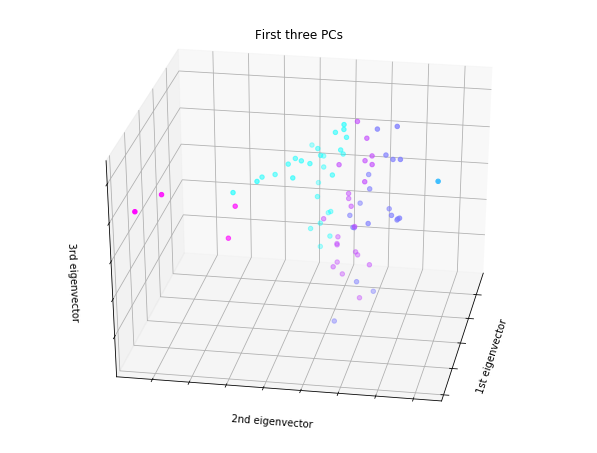

In [215]:
fig = plt.figure(1, figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=170)
ax.scatter(Xproj[:, 0], Xproj[:, 1], Xproj[:, 2], c=cr['clusters'],
           cmap=plt.cm.cool)
ax.set_title("First three PCs")
ax.set_xlabel("1st eigenvector")
ax.w_xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
ax.w_yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
ax.w_zaxis.set_ticklabels([])

plt.show()

###### fig16: 3D scatter plot of the precincts clustered by crime features. PCA was used to reduce the dimension of crime feature space from 7 to 3.

#### Discussion: The cluster may not make strong sense since the dots in the scatter plot with different colors are strangled with each other. There are four outliers in the scatter plot which are labeled as pink. They positioned far away from the swarm of other points and closer to the 3rd dimension.

# task 2.6 8/10 although you have no discussion of the association consistncy in socioeconomic space and crime space. are they consistent thus justifying modeling?

## 2.7 At last, create a function that for a target variable input generates a model based on median income (medianincome), green area (green), and unemployed fraction (unemployment), and returns some parameter of model quality and the most important feature in the model. The function should also print or otherwise report whether the feature is statistically significant. Run this function four times to predict BURGLARY, RAPE, MURDER, and TOTAL CRIME

I want this to be a function:

        def fitCrime(...):
            ...
            return importance,quality
    
You can run the function with all the precincts, or with the clusters you created above, but discuss the pros and cons of each scheme. You can use any model. I am ok with multi linear regression, but consider other options: trees, SVM, whatever you have explored in PUI, in other classes, in the EC project. I am not looking for a rigorous assessment. If you use statsmodels for regression you can pull any of the diagnostics in the model.summary() (any of the *appropriate* ones). If you use a machine learning method you can assess via cross validation, seeing how much the score changes between test and training sample. Keep in mind that am definitely more interested in the discussion than in the creation of a "good" model. 

**Discuss explicitly which features are important to predict what** 

In [216]:
import statsmodels.formula.api as smf

In [217]:
# renaming the columns of crime type dataset
cr.columns = ['BURGLARY', 'FELONY', 'GRAND_LARCENY', 'GL_MOTOR_VEHICLE', 'MURDER', 'RAPE', "ROBBERY", "TOTAL", "CLUSTERS"]
cr.head(2)

,BURGLARY,FELONY,GRAND_LARCENY,GL_MOTOR_VEHICLE,MURDER,RAPE,ROBBERY,TOTAL,CLUSTERS
0,228.777778,99.111111,1328.611111,77.000000,1.055556,8.166667,118.777778,1861.166667,0
1,221.111111,260.722222,494.277778,146.611111,10.611111,20.777778,317.388889,1451.500000,3


In [218]:
# constructing a function that can predict the crime rate based on some socioeconomic features
def fitCrime(cr_type):
    function = socioeconomics
    function[cr_type] = cr[cr_type]
    lm = smf.ols(formula = cr_type + '~ green + medianincome + unemployment - 1', data = function).fit()
    print(" The coefficients of the model are listed below: ")
    print(lm.params)
    print("\n The p-values of the coefficients are: ")
    print(lm.pvalues)
    print("\n the most important feature in the model is: {}".format(lm.pvalues.idxmin()))
    print("\n the R-squared value for this model is: {}.".format(lm.rsquared))

# FBB another cell where code extends past the cell length

In [219]:
fitCrime("BURGLARY")

 The coefficients of the model are listed below: 
green           -353.478897
medianincome       0.001696
unemployment    3277.871655
dtype: float64

 The p-values of the coefficients are: 
green           3.428502e-02
medianincome    1.323352e-05
unemployment    9.068112e-09
dtype: float64

 the most important feature in the model is: unemployment

 the R-squared value for this model is: 0.717360439179.


# FBB the coefficients cannot be interpreted if the features are not standardized and normalized

In [223]:
fitCrime("RAPE")

 The coefficients of the model are listed below: 
green           -42.729541
medianincome      0.000039
unemployment    390.645655
dtype: float64

 The p-values of the coefficients are: 
green           2.063866e-03
medianincome    1.890507e-01
unemployment    2.385939e-14
dtype: float64

 the most important feature in the model is: unemployment

 the R-squared value for this model is: 0.736524927681.


In [224]:
fitCrime("MURDER")

 The coefficients of the model are listed below: 
green           -22.415628
medianincome      0.000006
unemployment    181.146361
dtype: float64

 The p-values of the coefficients are: 
green           1.700210e-04
medianincome    6.106230e-01
unemployment    4.811245e-16
dtype: float64

 the most important feature in the model is: unemployment

 the R-squared value for this model is: 0.742125325404.


In [225]:
fitCrime("TOTAL")

 The coefficients of the model are listed below: 
green           -2072.455081
medianincome        0.010829
unemployment    17296.181184
dtype: float64

 The p-values of the coefficients are: 
green           1.331172e-02
medianincome    7.397501e-08
unemployment    1.817357e-09
dtype: float64

 the most important feature in the model is: unemployment

 the R-squared value for this model is: 0.763809230307.


##### Discussion: I run the function with all the precincts. 
* pros: the sample size is larger than just using the clusters, hence the model can have better prediction power for the average crime rate level of New York City as a whole, and reduce possible overfitting caused by using only one cluster. 
* cons: for the precincts that are in a cluster that deviate from the mainstream of the precincts, the prediction power of my model may not be very good. 

# FBB 2.7 
#task 2.7 10

# FBB so what do you conclude from all this???

# Extra Credit 

I decided to add this as the conversation kept getting pushed toward details of spatial joins during the final reviews. If this all was easy, recreate the percentage of green area in a precinct, the unemployment rate by precinct, and the median income by precinct.

you will need:
a shapefile for the NYC parks which you can access from the https://data.cityofnewyork.us/. With the overlay function get the area of the green spaces contained in a precinct. 
I only selectted the following park subcategories. 

selectedParks = ['Community Park', 'Recreation Field/Courts', 'Triangle/Plaza',
       'Garden', 'Neighborhood Park', 'Nature Area', 'Waterfront Facility',
       'Historic House Park', 'Playground', 
       'Flagship Park', 
       'Jointly Operated Playground', 'Managed Sites']


A census tract shapefile is also accessible through the NYC open data portal or http://www1.nyc.gov/site/planning/data-maps/open-data.page
    
Overlay the census tract and precinct geometries (geopandas.overlay) to get the fraction of each tract in a precinct. This will allow you to create a weighted average of the unemployment percentage and median income.

You will need tree features from the American Community Survey which you can find on American Fact Finder.   
If, as they should, these are accessed through the API your API link should begin with https://api.census.gov/ (e.g. [5 year ACS](https://www.census.gov/data/developers/data-sets/acs-5year.html))

- the 2015  5 year ACS survey unemployment data by census tract (the total number of individuals is available through the API at the census tract geometry aggregation level. 

- the 2015  5 year ACS survey total count of people by census tract (to generate the unemployment percentage).

- the 2015  5 year ACS survey median income by census tract.

Some precinct geometries will fail, and likely will report that the operation is not doable with MultiPolygons. These operations are actually doable with MultyPolygons, but some of the precincts have non valid geometries. For those you can use the convex hull (pctshp.geometry.map(lambda x: x.convex_hull)) to get the intersection, with some loss (is the loss in accuracy or precision?)

In [ ]:
precinct_shp.head(2)

In [ ]:
pctshp = precinct_shp
pctshp = pctshp.geometry.map(lambda x: x.convex_hull)

In [ ]:
pctshp = gpd.GeoDataFrame(pctshp, geometry = 'geometry')

In [ ]:
pctshp.head(2)

In [ ]:
socioeconomics.head()

In [ ]:
# downloading the park shapefile as a zip file
site = 'https://data.cityofnewyork.us/api/geospatial/rjaj-zgq7?method=export&format=Shapefile'
urllib.urlretrieve(site,"parks_shapefile.zip")

In [ ]:
#extract the zipfile
zip_ref = zipfile.ZipFile("parks_shapefile.zip", 'r')
zip_ref.extractall(os.getenv('PUIDATA')+'/HH1827/')
zip_ref.close()

In [ ]:
# read the park shapefile as geodataframe. this code is cited from my HW 9.
park_shp = gpd.GeoDataFrame.from_file(os.getenv('PUIDATA')+'/HH1827/'+[file for file in os.listdir(os.getenv ('PUIDATA')+ "/HH1827") \
                                                     if "geo_export_" in file and ".shp" in file][0])
park_shp.head(3)

In [ ]:
selectedParks = ['Community Park', 'Recreation Field/Courts', 
                 'Triangle/Plaza', 'Garden', 'Neighborhood Park', 
                 'Nature Area', 'Waterfront Facility', 
                 'Historic House Park', 'Playground', 'Flagship Park', 
                 'Jointly Operated Playground', 'Managed Sites']

In [ ]:
# generate dummy variables to decide whether the park in shapefile is in selected types
dummy = []
for i in park_shp.typecatego:
    if i in selectedParks:
        dummy.append("True")
    else:
        dummy.append("False")

se = pd.Series(dummy)
park_shp['dummy'] = se.values
park_shp.head(2)

In [ ]:
# deleting parks with unwanted types
park_shp = park_shp[park_shp.dummy == "True"]
park_shp.shape

In [ ]:
# overlay the park and precinct shapefile 
park_PCT = gpd.overlay(park_shp, pctshp, how = "intersection")
park_PCT = gpd.GeoDataFrame(park_PCT, geometry = "geometry")
park_PCT.head(3)

In [ ]:
park_PCT.shape

In [ ]:
# calculating the areas of each park overlaying with the precinct
park_PCT["intersect_area"] = park_PCT["geometry"].area
park_PCT.head(2)

In [ ]:
# summing up the intersection area in each precinct
park_pct = park_PCT[["precinct", "intersect_area"]]
park_pct = pd.DataFrame(park_pct.groupby('precinct')['intersect_area'].sum())
park_pct = park_pct.reset_index()
park_pct["precinct"] = pd.to_numeric(park_pct["precinct"]).astype(float)
park_pct.head()

In [ ]:
# calculating the areas of precincts
precinct_area = precinct_shp
precinct_area["PCT_area"] = precinct_area["geometry"].area
precinct_area.head(3)

In [ ]:
# calculating the percentage of parks in each precinct by area
park_pct = pd.merge(precinct_area, park_pct, left_on = "precinct", right_on = "precinct")
park_pct["park_percent"] = park_pct["intersect_area"] / park_pct["PCT_area"]
park_pct.head()

In [ ]:
# Downloading Census Tract shapefile as zipfile
site = "https://data.cityofnewyork.us/api/geospatial/fxpq-c8ku?method=export&format=Shapefile"
urllib.urlretrieve(site,"CT_shapefile.zip")

In [ ]:
#extract the zipfile
zip_ref = zipfile.ZipFile("CT_shapefile.zip", 'r')
zip_ref.extractall()
zip_ref.close()

In [ ]:
# read the CT shapefile as geodataframe
CT_shp = gpd.GeoDataFrame.from_file("geo_export_121f1e88-e9af-47d2-9dd2-8a8db23922a4.shp")
CT_shp.head(2)

In [ ]:
pctshp["precinct"] = precinct_shp["precinct"]
pctshp.head(3)

In [ ]:
# overlay the census tract and precinct shapefile 
CT_PCT = gpd.overlay(CT_shp, pctshp, how = "intersection")
CT_PCT = gpd.GeoDataFrame(CT_PCT, geometry = "geometry")
CT_PCT

In [ ]:
# calculating the overlapping areas between CT and PCT
CT_PCT["CT_PCT_intersect"] = CT_PCT["geometry"].area
CT_PCT.head(2)

In [ ]:
PCT_area = precinct_area[["PCT_area", "precinct"]]
PCT_area.head()

In [ ]:
# calculating how much does each census tract account for in each preccinct by area
ct_pct = pd.merge(PCT_area, CT_PCT, left_on = "precinct", right_on = "precinct")
ct_pct["CT/PCT"] = ct_pct["CT_PCT_intersect"] / ct_pct["PCT_area"]
ct_pct.head()

In [ ]:
import requests
import json
import io

In [ ]:
from myAPI import myAPIkey

In [ ]:
# getting the unemployment data
keyUNE = "B23025_005E"
url = "https://api.census.gov/data/2015/acs/acs5?get=NAME," + keyUNE +\
"&for=tract:*&in=state:36&key=" + myAPIkey
resp = requests.request('GET', url).content

UNE = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
UNE.head(3)

In [ ]:
# Selceting NYC boroughs
UNE = UNE[(UNE.county == 47) | (UNE.county == 5)| (UNE.county == 61)| (UNE.county == 81)| (UNE.county == 85)]

In [ ]:
# identifying borough code
bc = []
for i in UNE.county:
    if i == 47:
        bc.append(3)
    elif i == 5:
        bc.append(2)
    elif i == 61:
        bc.append(1)
    elif i == 81:
        bc.append(4)
    elif i == 85:
        bc.append(5)
se = pd.Series(bc)
UNE['boro_code'] = se.values
UNE.head(2)

In [ ]:
# generating boro-tract code for merging with shapefile
UNE["boro_tract"] = UNE["boro_code"]* 10**6 + UNE["tract"]
UNE.head(3)

In [ ]:
# getting the total count of people by census tract
keyPP = 'B01003_001E'
url = "https://api.census.gov/data/2015/acs/acs5?get=NAME," + keyPP +\
"&for=tract:*&in=state:36&key=" + myAPIkey
resp = requests.request('GET', url).content
PP = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
PP.head(3)

In [ ]:
# Selecting NYC boroughs
PP = PP[(PP.county == 47) | (PP.county == 5)| (PP.county == 61)| (PP.county == 81)| (PP.county == 85)]

In [ ]:
# identifying borough codes
bc = []
for i in PP.county:
    if i == 47:
        bc.append(3)
    elif i == 5:
        bc.append(2)
    elif i == 61:
        bc.append(1)
    elif i == 81:
        bc.append(4)
    elif i == 85:
        bc.append(5)
se = pd.Series(bc)
PP['boro_code'] = se.values
PP.head(2)

In [ ]:
# generatng boro_tract code for merging with shapefile
PP["boro_tract"] = PP["boro_code"]* 10**6 + PP["tract"]
PP.head(3)

In [ ]:
UNE_RATE = PP[["B01003_001E", "boro_tract"]]
UNE_RATE["unemployment"] = UNE["B23025_005E"]
UNE_RATE["unem_rate"] = UNE_RATE["unemployment"] / UNE_RATE["B01003_001E"]
UNE_RATE.head(3)

In [ ]:
ct_pct["boro_ct201"] = ct_pct["boro_ct201"].astype(int)
UNE_RATE["boro_tract"] = UNE_RATE["boro_tract"].astype(int)

In [ ]:
# merging unemployment rate data with shapefile, and dropping invalid rows
unem_rate = pd.merge(ct_pct, UNE_RATE, left_on = "boro_ct201", right_on = "boro_tract")
unem_rate.head(3)

In [ ]:
unem_rate = unem_rate.dropna(axis=0, how='any')
unem_rate.head(3)

In [ ]:
# calculating weighted average of unemployment in each precinct
wtavg = lambda x: np.average(x["unem_rate"], weights = x["CT/PCT"], axis = 0)
dfwavg_une = unem_rate.groupby('precinct').apply(wtavg)
dfwavg_une = pd.DataFrame(dfwavg_une)
dfwavg_une = dfwavg_une.reset_index()
dfwavg_une.columns = ["precinct", "unemployment"]
dfwavg_une.head()

In [ ]:
# getting the medium income by census tract
keyINC = 'B06011_001E'
url = "https://api.census.gov/data/2015/acs/acs5?get=NAME," + keyINC +\
"&for=tract:*&in=state:36&key=" + myAPIkey
resp = requests.request('GET', url).content
INC = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
INC.head(3)

In [ ]:
# Selecting NYC boroughs
INC = INC[(INC.county == 47) | (INC.county == 5)| (INC.county == 61)| (INC.county == 81)| (INC.county == 85)]

In [ ]:
# identifying borough code
bc = []
for i in INC.county:
    if i == 47:
        bc.append(3)
    elif i == 5:
        bc.append(2)
    elif i == 61:
        bc.append(1)
    elif i == 81:
        bc.append(4)
    elif i == 85:
        bc.append(5)
se = pd.Series(bc)
INC['boro_code'] = se.values
INC.head(2)

In [ ]:
# generatng boro_tract code for merging with shapefile
INC["boro_tract"] = INC["boro_code"]* 10**6 + INC["tract"]
INC.head(3)

In [ ]:
ct_pct["boro_ct201"] = ct_pct["boro_ct201"].astype(int)
INC["boro_tract"] = INC["boro_tract"].astype(int)
INC = INC[["B06011_001E", "boro_tract"]]
INC.head(3)

In [ ]:
# merging income data with shapefile
income = pd.merge(ct_pct, INC, left_on = "boro_ct201", right_on = "boro_tract")
income.head(3)

In [ ]:
income = income.replace('null', 0)
income = income.replace("-666666666", 0)
income = income.drop(income[income.B06011_001E == 0].index)
income.head(3)

In [ ]:
# calculating the weighted average median income of each precinct
wtavg = lambda x: np.average(x["B06011_001E"].astype(float), weights = x["CT/PCT"], axis = 0)
dfwavg_inc = income.groupby('precinct').apply(wtavg)
dfwavg_inc = pd.DataFrame(dfwavg_inc)
dfwavg_inc = dfwavg_inc.reset_index()
dfwavg_inc.columns = ["precinct", "medianincome"]
dfwavg_inc.head()

In [ ]:
# finally pulling all three socioeconomic features together
socio_econ = pd.DataFrame(park_pct[["precinct","park_percent"]])
socio_econ["unemployment"] = dfwavg_une["unemployment"]
socio_econ["medianincome"] = dfwavg_inc["medianincome"]
socio_econ.head()

##### Task 1.1 5 not moved to PUIdata

Task 1.2 10

Task 1.3 8 no comments

Task 1.4 10

Task 1.5 7 -5 for no discussion of cluster numbers , +2 for good discussion of trends

Task 2.1 8/10 moved to individual dir PUIdata/hh182

Task 2.2 10/10

Task 2.3 10

Task 2.4 5/10 wrong means

Task 2.5 5/10 no discussion

Task 2.6 8/10 no discussion that leads to modeling, questionable representation and no discussin of cluster bumbers

Task 2.7 10

#  96/100

- 3 for PEP8 violations: wrong spaces, imports in the middle of the notebook, many lines extending past the cell width, also other smaller things: variable names etc. 

-15% cause the notebook is broken in many points and the original submission was not renderes. 

# 81.6/100 - good progress!

EC2 plot good but no discussion

EC3 good attempt on a difficult task. in the end the geometric operations wer on the wrong coordinattes, adn the feattures from ACS were tno the right ones

# 85/100